<a href="https://colab.research.google.com/github/BrianCollinss/A4I064-ML/blob/main/Scripts/A4I064_ML_Implementation_Rice_3months.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 This code implements ML models for rice data. It reads two input files: "A4I046_Rice_Combined_Data_for_ML.csv" and "A4I06_Rice_Yield_Combined_for_ML.csv" from the input folder which has been mounted from the UniSQ Umail drive. The input files are joined by matching their locations. NA values are dropped.

In [305]:
# Set the path containing the required CSV files.
dataFolder = r"C:\Users\U8019357\UniSQ\A4I Geospatial Tech - UniSQ Internal - UniSQ Internal\2 - ML\Processed Data"

In [306]:
import os
import sys
import subprocess

# This gives the name of the environment directory
print("Environment name:", os.path.basename(sys.prefix))

Environment name: A4I064-ML


In [307]:
# Install necessary packages, if needed

required_packages = ["pandas", "numpy", "scipy", "matplotlib", "seaborn", "geopy", "scikit-learn", "xgboost", "openpyxl", "statsmodels"]

for package in required_packages:
    try:
        __import__(package if package != "scikit-learn" else "sklearn")
        print(f"{package} is already installed.")
    except ImportError:
        print(f"{package} not found. Installing...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package])

print("All packages have been installed!")

pandas is already installed.
numpy is already installed.
scipy is already installed.
matplotlib is already installed.
seaborn is already installed.
geopy is already installed.
scikit-learn is already installed.
xgboost is already installed.
openpyxl is already installed.
statsmodels is already installed.
All packages have been installed!


In [308]:
# Import necessary packages

import pandas as pd
import numpy as np
from scipy.interpolate import make_interp_spline, make_smoothing_spline, interp1d, PchipInterpolator
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess

from geopy.distance import geodesic
from pandas.tseries.offsets import MonthBegin

from sklearn.model_selection import train_test_split, cross_val_score, LeaveOneOut
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, LeaveOneOut, cross_val_predict
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

import xgboost as xgb
from sklearn.neural_network import MLPRegressor

# Suppress all warnings
import warnings
warnings.filterwarnings("ignore")

In [309]:
data_polygon = pd.read_csv(dataFolder + '/A4I064_Rice_Combined_VIs_for_ML.csv')
print(data_polygon.head(10))

# Reading in the yield data file
yield_data = pd.read_csv(dataFolder + '/A4I064_Rice_Yield_for_ML.csv')
yield_data.head(10)

   Crop         Source Plot_ID   latitude   longitude        Date     ARI  \
0  Rice    Landsat-GEE    AG01  10.347069  105.443205   8/01/2024     NaN   
1  Rice    Landsat-GEE    AG01  10.347069  105.443205  16/01/2024     NaN   
2  Rice    Landsat-GEE    AG01  10.347069  105.443205  24/01/2024     NaN   
3  Rice    Landsat-GEE    AG01  10.347069  105.443205  25/01/2024 -0.3361   
4  Rice  Sentinel2-GEE    AG01  10.347069  105.443205  25/01/2024 -1.1057   
5  Rice  Sentinel2-GEE    AG01  10.347069  105.443205  30/01/2024 -1.1411   
6  Rice    Landsat-GEE    AG01  10.347069  105.443205   1/02/2024     NaN   
7  Rice    Landsat-GEE    AG01  10.347069  105.443205  10/02/2024     NaN   
8  Rice  Sentinel2-GEE    AG01  10.347069  105.443205  14/02/2024 -1.1303   
9  Rice    Landsat-GEE    AG01  10.347069  105.443205  17/02/2024     NaN   

      CIG     DVI     EVI   GNDVI   MSAVI    NDVI    NDWI     PRI     RVI  \
0     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN  

,ModelID,CodeGPS,Longitude,Latitude,SowDate,HarDate,Variety,YieldPrevious,YieldCurrent
0,1,DT01,105.6146,10.5115,7/10/2024,15/01/2025,OM18,6.0,7.1
1,2,DT02,105.6510,10.5282,10/10/2024,25/01/2025,OM18,5.4,7.0
2,3,DT03,105.6809,10.5267,8/10/2024,15/01/2025,OM18,6.2,8.3
3,4,DT04,105.7157,10.5257,18/10/2024,17/01/2025,OM18,6.9,7.8
4,5,DT05,105.7295,10.5253,17/10/2024,15/01/2025,OM18,6.9,8.1
5,6,DT06,105.7621,10.5284,1/10/2024,5/01/2025,OM18,6.2,8.0
6,7,DT07,105.7783,10.5341,22/10/2024,24/01/2025,OM18,6.2,7.5
7,8,DT08,105.7810,10.5341,19/10/2024,26/01/2025,OM18,6.2,7.8
8,9,DT09,105.8172,10.5136,5/10/2024,15/01/2025,5451,6.5,8.1
9,10,DT10,105.8191,10.5136,22/10/2024,24/01/2025,5451,8.0,8.8


**Note that in the Source column, "Sentinel2" refers to downloaded data whereas "Sentinel-2" refers to data from GEE. **

In [310]:
# List of columns to keep
columns_to_keep = ['Crop', 'Source', 'Plot_ID', 'latitude', 'longitude', 'Date', 'ARI', 'CIG', 'DVI', 'EVI',
                   'GNDVI', 'MSAVI', 'NDVI','NDWI', 'PRI', 'RVI', 'SAVI', 'TVI', 'VARI', 'WDRVI']

# Select only the columns to keep
data_polygon = data_polygon[columns_to_keep].copy()

# Drop rows with any NA values
data_polygon = data_polygon.dropna()

print(data_polygon.head(), "\n")
print(len(data_polygon), "\n")

print(data_polygon['Date'].min())
print(data_polygon['Date'].max())

    Crop         Source Plot_ID   latitude   longitude        Date     ARI  \
3   Rice    Landsat-GEE    AG01  10.347069  105.443205  25/01/2024 -0.3361   
4   Rice  Sentinel2-GEE    AG01  10.347069  105.443205  25/01/2024 -1.1057   
5   Rice  Sentinel2-GEE    AG01  10.347069  105.443205  30/01/2024 -1.1411   
8   Rice  Sentinel2-GEE    AG01  10.347069  105.443205  14/02/2024 -1.1303   
10  Rice    Landsat-GEE    AG01  10.347069  105.443205  26/02/2024 -2.1043   

       CIG     DVI     EVI   GNDVI   MSAVI    NDVI    NDWI     PRI     RVI  \
3   1.4977  0.3576  0.5454  0.4279  0.4147  0.4574 -0.4279  0.0368  2.6889   
4   1.8249  0.3090  0.6206  0.4766  0.4223  0.4766 -0.4766  0.0797  3.3152   
5   1.9267  0.3236  0.6313  0.4901  0.4393  0.4901 -0.4901  0.0816  3.4480   
8   1.6480  0.2935  0.5466  0.4513  0.4017  0.4513 -0.4513  0.0842  3.1365   
10  2.6868  0.2777  0.4848  0.5723  0.4318  0.6306 -0.5723  0.0919  4.4424   

      SAVI     TVI    VARI   WDRVI  
3   0.4184  0.9785  0.057

# Filtering the downloaded Sentinel-2 data from the compiled dataset.

In [311]:
# Filter data by Source
# final_VI_df = data_polygon[data_polygon['Source'].isin(['Landsat','Sentinel2','Landsat-GEE','Sentinel2-GEE','Drone'])].copy()
final_VI_df = data_polygon[data_polygon['Source'].isin(['Sentinel2','Sentinel2-GEE','Drone'])].copy()

display(final_VI_df.shape)
display(final_VI_df.head())

(972, 20)

,Crop,Source,Plot_ID,latitude,longitude,Date,ARI,CIG,DVI,EVI,GNDVI,MSAVI,NDVI,NDWI,PRI,RVI,SAVI,TVI,VARI,WDRVI
4,Rice,Sentinel2-GEE,AG01,10.347069,105.443205,25/01/2024,-1.1057,1.8249,0.3090,0.6206,0.4766,0.4223,0.4766,-0.4766,0.0797,3.3152,0.4304,0.9882,0.1474,-0.5023
5,Rice,Sentinel2-GEE,AG01,10.347069,105.443205,30/01/2024,-1.1411,1.9267,0.3236,0.6313,0.4901,0.4393,0.4901,-0.4901,0.0816,3.4480,0.4457,0.9950,0.1479,-0.4875
8,Rice,Sentinel2-GEE,AG01,10.347069,105.443205,14/02/2024,-1.1303,1.6480,0.2935,0.5466,0.4513,0.4017,0.4513,-0.4513,0.0842,3.1365,0.4116,0.9753,0.1418,-0.5227
11,Rice,Sentinel2-GEE,AG01,10.347069,105.443205,29/02/2024,-0.6101,1.1447,0.2528,0.4761,0.3631,0.3288,0.3631,-0.3631,0.0577,2.4103,0.3404,0.9290,0.0987,-0.6119
14,Rice,Sentinel2-GEE,AG01,10.347069,105.443205,20/03/2024,0.4357,0.3826,0.0588,0.1136,0.1591,0.0777,0.1591,-0.1591,-0.0501,1.2526,0.0851,0.8116,-0.0863,-0.7776


# Plotting all VI time series values for by field points.  

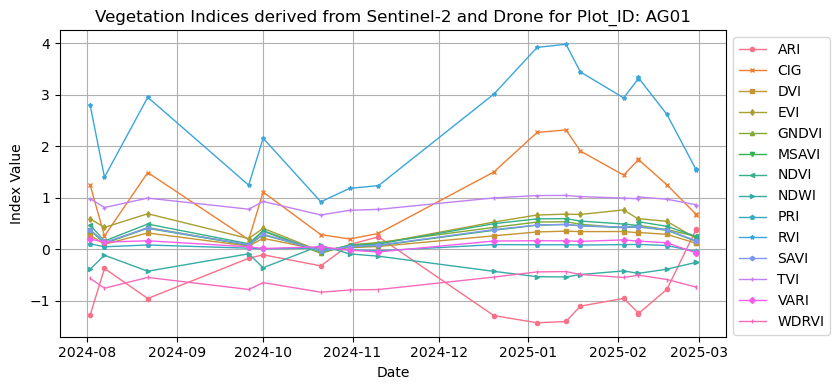

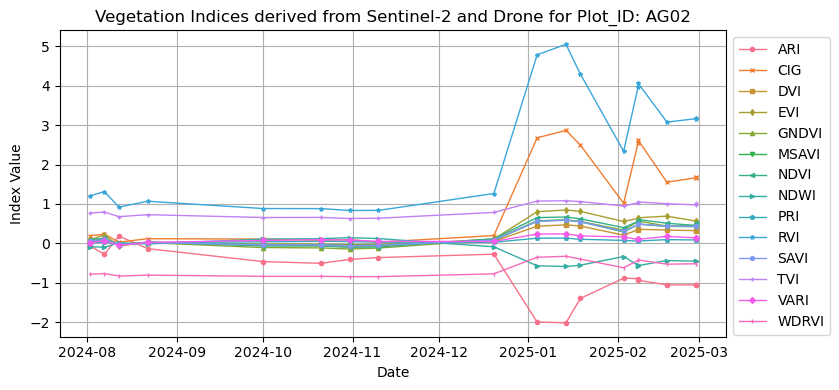

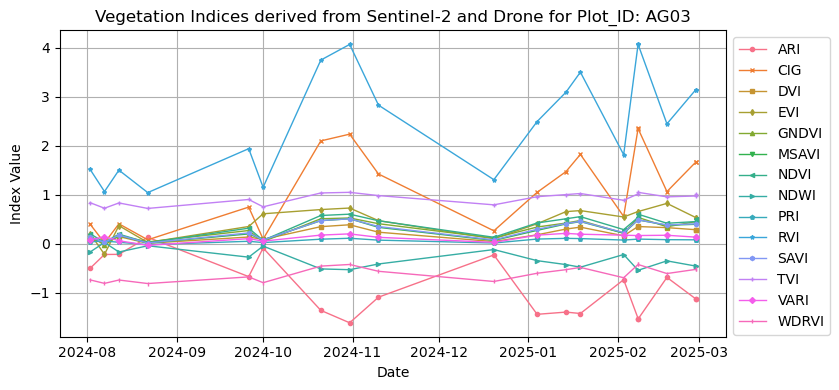

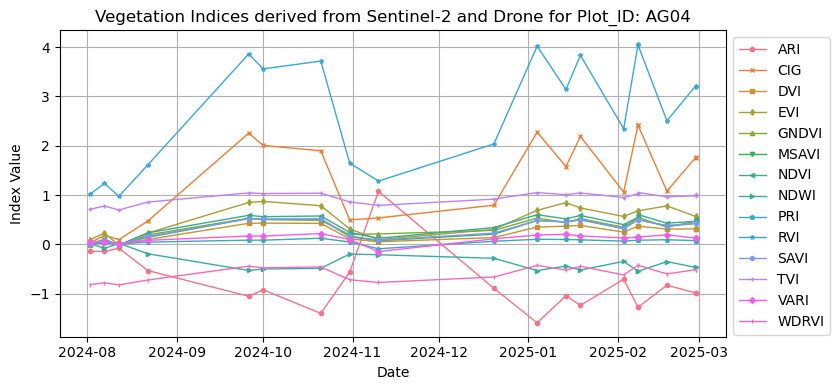

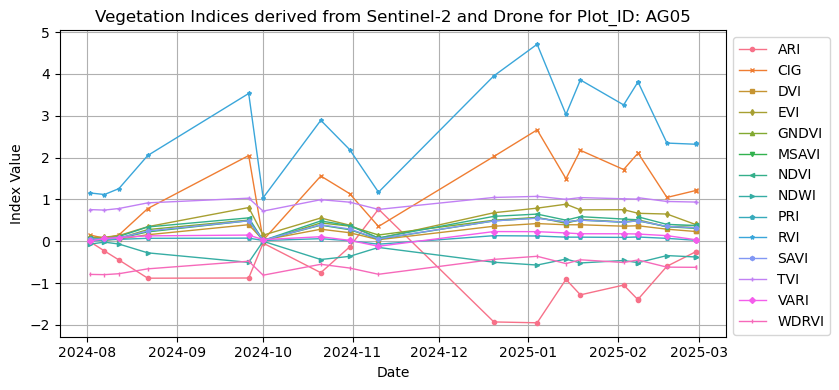

...

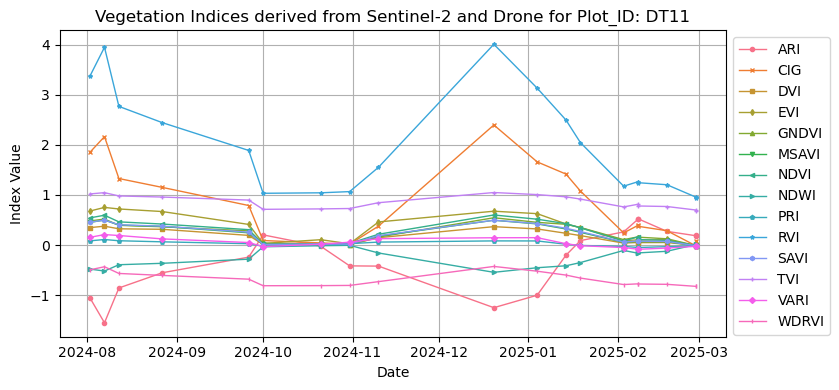

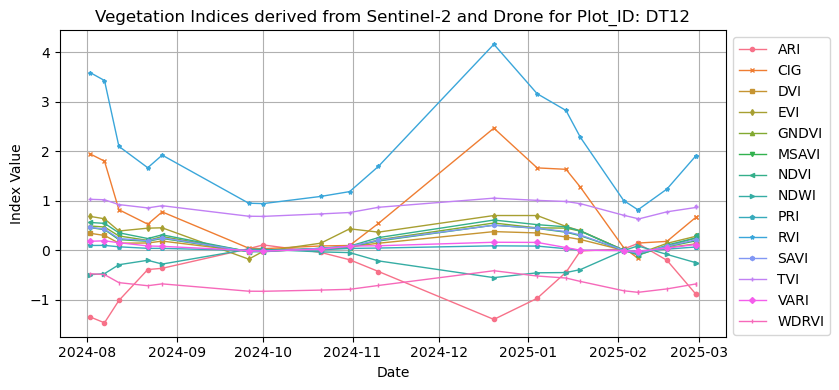

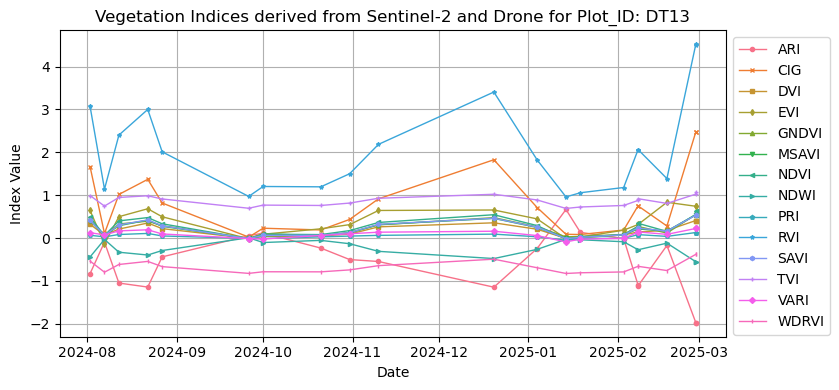

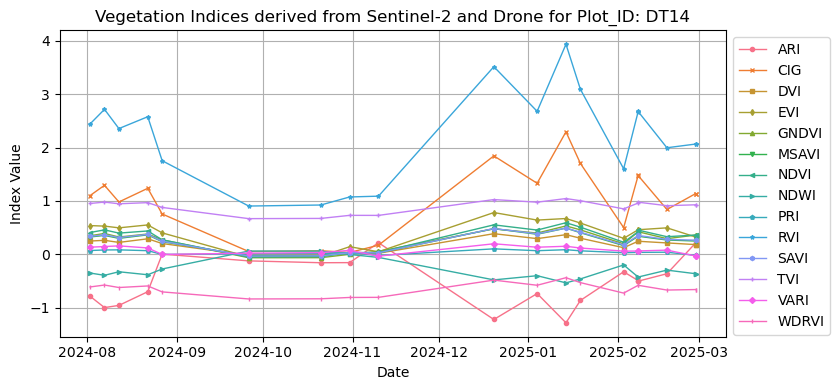

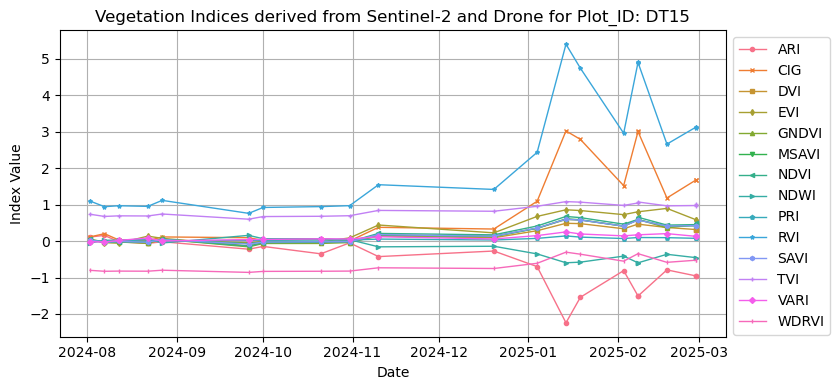

In [312]:
# Plotting combined Sentinel-2 and drone data series by location
# Ensure 'Date' is datetime for filtering and plotting
final_VI_df['Date'] = pd.to_datetime(final_VI_df['Date'], errors='coerce')

# Define the date range for plotting
start_date = pd.to_datetime('2024-06-01')
end_date = pd.to_datetime('2025-04-30')

# List of vegetation indices to plot (all columns except Plot_ID, Source, Crop, latitude, longitude, Date)
indices_to_plot = [col for col in final_VI_df.columns if col not in ['Plot_ID', 'Source', 'Crop', 'latitude', 'longitude', 'Date']]

# Get unique IDs
unique_ids = final_VI_df['Plot_ID'].unique()

# Define marker styles
markers = ['o', 'x', 's', 'd', '^', 'v', '<', '>', 'p', '*', 'h', '+', 'D', '|']
# Define a color palette with enough distinct colors
colors = sns.color_palette('husl', len(indices_to_plot))

# Loop through each unique Plot_ID and create a separate plot
for site_id in unique_ids:
    subset_df = final_VI_df[(final_VI_df['Plot_ID'] == site_id) &
                            (final_VI_df['Date'] >= start_date) &
                            (final_VI_df['Date'] <= end_date)].sort_values(by='Date')

    if subset_df.empty:
        print(f"No Sentinel-2 data for Plot_ID: {site_id} within the specified date range.")
        continue

    plt.figure(figsize=(10, 4))
    plt.title(f'Vegetation Indices derived from Sentinel-2 and Drone for Plot_ID: {site_id}')
    plt.xlabel('Date')
    plt.ylabel('Index Value')

    # Set x-axis limits to the desired date range
    # plt.xlim(start_date, end_date)

    for i, index in enumerate(indices_to_plot):
        if index in subset_df.columns:
            plt.plot(subset_df['Date'], subset_df[index], marker=markers[i % len(markers)],
                     linestyle='-', linewidth=1, markersize=3, color=colors[i % len(colors)], label=index)
        else:
            print(f"Warning: Index '{index}' not found for Plot_ID '{site_id}'.")

    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.grid(True)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

# Plotting the individual VI time series values for all the field points.  

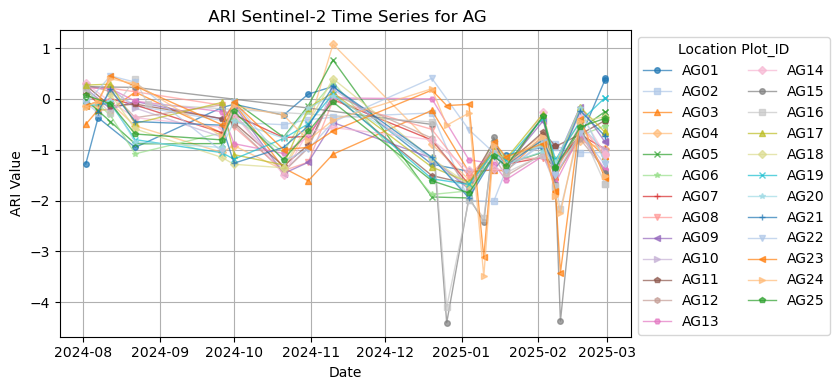

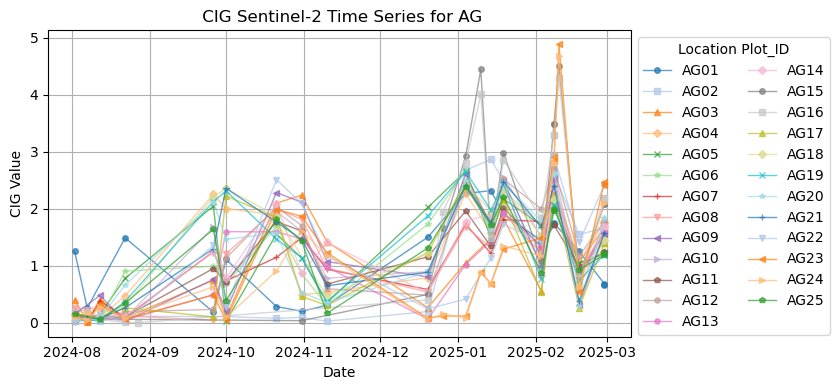

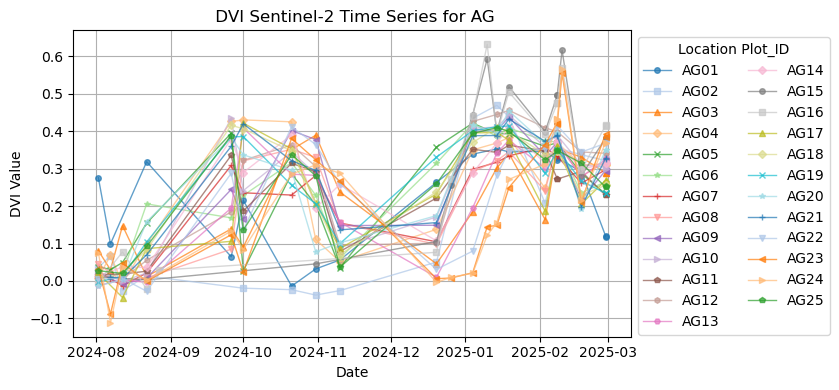

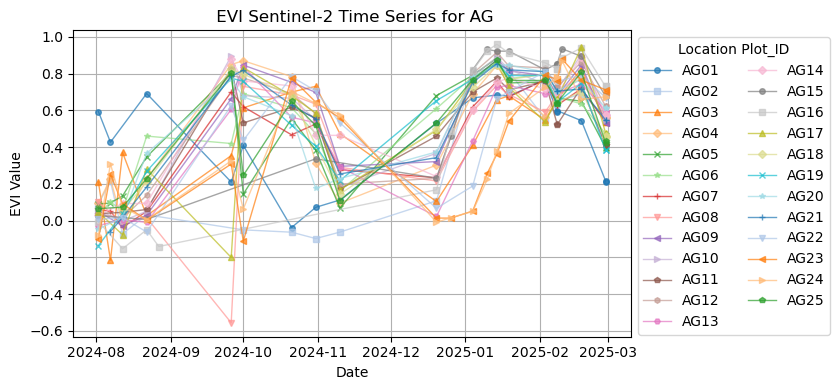

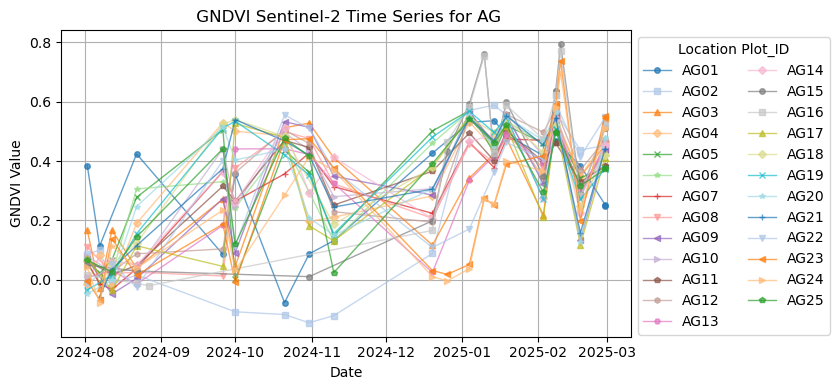

...

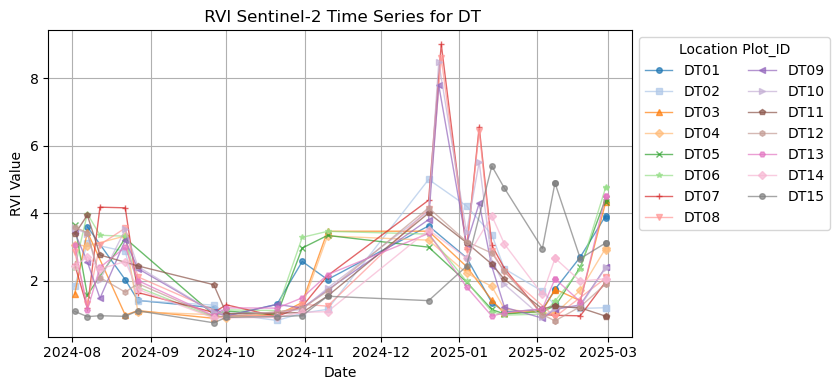

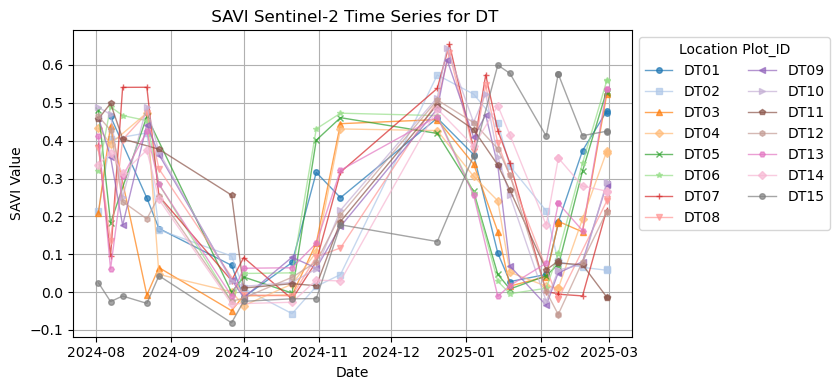

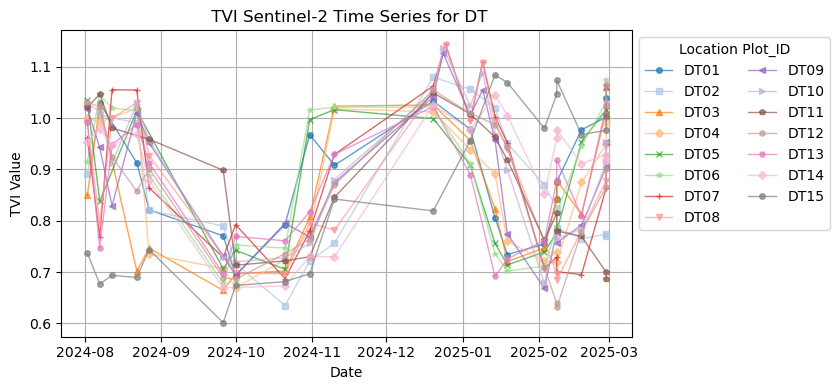

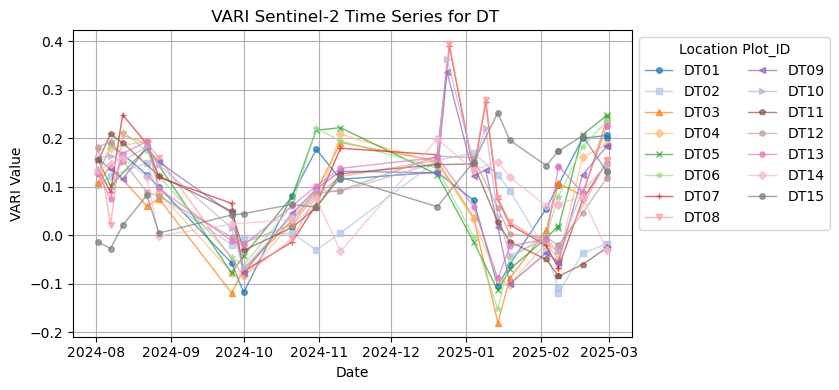

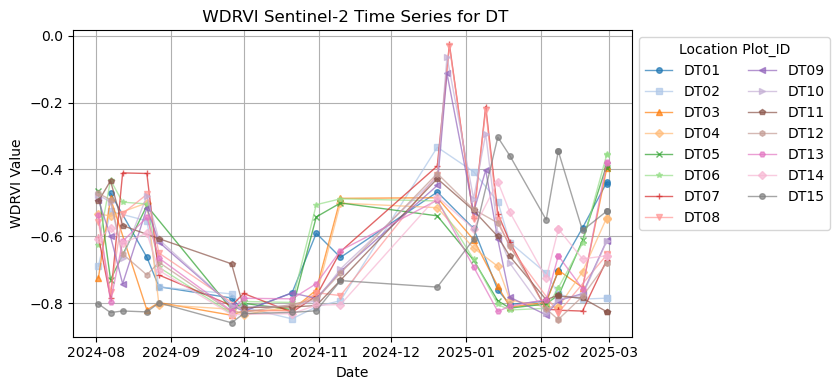

In [313]:
# Define the date range for plotting
start_date = pd.to_datetime('2024-08-01') # <-- Set your desired start date here
end_date = pd.to_datetime('2025-04-30')   # <-- Set your desired end date here

# Identify vegetation index columns in final_VI_df
# Use columns from final_VI_df excluding Plot_ID, Source, Crop, lat, lon, Date
vi_columns = ['ARI', 'CIG', 'DVI', 'EVI', 'GNDVI', 'MSAVI','NDVI', 'NDWI', 'PRI', 'RVI', 'SAVI', 'TVI','VARI', 'WDRVI']

# Ensure 'Date' is datetime
final_VI_df['Date'] = pd.to_datetime(final_VI_df['Date'], errors='coerce')

# Get unique IDs from final_VI_df
unique_ids = final_VI_df['Plot_ID'].unique()

# Split IDs into two categories based on prefix
ag_ids = [uid for uid in unique_ids if uid.startswith('AG')]
dt_ids = [uid for uid in unique_ids if uid.startswith('DT')]

# Define a list of markers to cycle through
markers = ['o', 's', '^', 'D', 'x', '*', '+', 'v', '<', '>', 'p', 'h', 'H', 'D']

# Define a color palette for the lines (using seaborn for a variety of colors)
# Use separate color palettes for AG and DT IDs for better visual distinction if needed, or a single large one
colors = sns.color_palette('tab20', max(len(ag_ids), len(dt_ids))) # Using tab20 which has 20 colors, might need more if > 20 IDs per category

# Create dictionaries to map each Plot_ID to a unique marker and color within its category
ag_id_styles = {ag_ids[i]: {'marker': markers[i % len(markers)], 'color': colors[i % len(colors)]}
                for i in range(len(ag_ids))}

dt_id_styles = {dt_ids[i]: {'marker': markers[i % len(markers)], 'color': colors[i % len(colors)]}
                for i in range(len(dt_ids))}

# Combine styles for easier lookup
id_styles = {**ag_id_styles, **dt_id_styles}

# Define categories to loop through
categories = {'AG': ag_ids, 'DT': dt_ids}

# Loop through each category
for category, ids_in_category in categories.items():
    # Loop through each vegetation index and create a separate plot for this category
    for vi in vi_columns:
        plt.figure(figsize=(10, 4))
        plt.title(f' {vi} Sentinel-2 Time Series for {category}')
        plt.xlabel('Date')
        plt.ylabel(f'{vi} Value')
        plt.grid(True)

        # Set x-axis limits to the desired date range
        # plt.xlim(start_date, end_date)

        # Loop through each Plot_ID in the current category and plot its time series for the current VI
        for site_id in ids_in_category:
            # Filter data for the current site Plot_ID and VI, and sort by date
            site_vi_data = final_VI_df[(final_VI_df['Plot_ID'] == site_id) &
                                         (final_VI_df['Date'] >= start_date) & # Filter by start date
                                         (final_VI_df['Date'] <= end_date) &   # Filter by end date
                                         final_VI_df[vi].notna()].sort_values(by='Date').copy()

            if not site_vi_data.empty:
                # Get the marker and color for this Plot_ID from the combined styles dictionary
                style = id_styles.get(site_id, {'marker': 'o', 'color': 'gray'}) # Default to circle, gray if Plot_ID not in dict

                plt.plot(site_vi_data['Date'], site_vi_data[vi],
                         marker=style['marker'], linestyle='-', linewidth=1, markersize=4,
                         color=style['color'], label=site_id, alpha=0.7) # Use site_id as label


        # Add a legend (can be very cluttered with many IDs)
        # Consider removing or adjusting the legend if it's unreadable
        plt.legend(title='Location Plot_ID', loc='best', bbox_to_anchor=(1, 1), ncol=2)
        plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make space for legend
        plt.show()

In [314]:
yield_data.rename(columns={'Latitude':'latitude','Longitude':'longitude', 'CodeGPS': 'Plot_ID'}, inplace=True)

# Drop the 'ModelID' column if it exists
if 'ModelID' in yield_data.columns:
    yield_data = yield_data.drop(columns=['ModelID'])

yield_data.head()

,Plot_ID,longitude,latitude,SowDate,HarDate,Variety,YieldPrevious,YieldCurrent
0,DT01,105.6146,10.5115,7/10/2024,15/01/2025,OM18,6.0,7.1
1,DT02,105.6510,10.5282,10/10/2024,25/01/2025,OM18,5.4,7.0
2,DT03,105.6809,10.5267,8/10/2024,15/01/2025,OM18,6.2,8.3
3,DT04,105.7157,10.5257,18/10/2024,17/01/2025,OM18,6.9,7.8
4,DT05,105.7295,10.5253,17/10/2024,15/01/2025,OM18,6.9,8.1


In [315]:
# Ensure 'SowDate' and 'HarDate' are datetime objects
yield_data['SowDate'] = pd.to_datetime(yield_data['SowDate'], dayfirst=True, errors='coerce')
yield_data['HarDate'] = pd.to_datetime(yield_data['HarDate'], dayfirst=True, errors='coerce')

# Calculate the difference in days
yield_data['CropSeasonDays'] = (yield_data['HarDate'] - yield_data['SowDate']).dt.days

# Check for crop seasons less than 90 days
short_season_ids = yield_data[yield_data['CropSeasonDays'] < 80]['Plot_ID'].tolist()
if short_season_ids:
    print(f"Crop season less than 80 days for IDs: {', '.join(short_season_ids)}")
else:
    print("No crop seasons less than 80 days.")

# Check for crop seasons more than 120 days
long_season_ids = yield_data[yield_data['CropSeasonDays'] > 120]['Plot_ID'].tolist()
if long_season_ids:
    print(f"Crop season more than 120 days for IDs: {', '.join(long_season_ids)}")
else:
    print("No crop seasons more than 120 days.")


No crop seasons less than 80 days.
No crop seasons more than 120 days.


# Using lowess to smoothen the VIs at the observed date points.

In [316]:
def smooth_data_lowess(df, vi_index, frac=0.3, gap_days=15):
    """
    Applies LOWESS smoothing to a vegetation index time series for a single location,
    after inserting ONE interpolated midpoint whenever two consecutive valid dates are
    separated by more than `gap_days`.

    Args:
        df: DataFrame for a single location/Plot_ID with 'Date' as index (datetime-like).
        vi_index: Name of the vegetation index column to smooth.
        frac: Fraction of data used when estimating each y-value in LOWESS.
        gap_days: Threshold (in days). If the gap between two valid points exceeds this,
                  insert one midpoint by linear interpolation before smoothing.

    Returns:
        A numpy array of smoothed values aligned to df.index, or an empty array if
        smoothing is not possible.
    """

    # Basic checks
    if vi_index not in df.columns or df[vi_index].dropna().empty:
        return np.array([])

    # Ensure sorted by Date
    df = df.sort_index()

    # Valid points: non-NaN value and non-NaT date
    valid_mask = df[vi_index].notna() & df.index.notna()

    if valid_mask.sum() < 3:
        return np.array([])  # Not enough points for smoothing

    # Original x (ordinals) and y for valid points
    x_orig = df.index[valid_mask].map(pd.Timestamp.toordinal).to_numpy()
    y_orig = df.loc[valid_mask, vi_index].to_numpy()

    # Build augmented arrays with midpoints for large gaps
    x_aug = []
    y_aug = []
    x_aug.append(x_orig[0])
    y_aug.append(y_orig[0])

    for i in range(len(x_orig) - 1):
        x0, x1 = x_orig[i], x_orig[i + 1]
        y0, y1 = y_orig[i], y_orig[i + 1]

        # If the gap exceeds the threshold, insert ONE midpoint
        if (x1 - x0) > gap_days:
            x_mid = x0 + (x1 - x0) // 2  # integer midpoint in ordinal days
            # Linear interpolation for the midpoint value
            y_mid = y0 + (y1 - y0) * ((x_mid - x0) / (x1 - x0))
            x_aug.append(int(x_mid))
            y_aug.append(float(y_mid))

        # Always append the next original point
        x_aug.append(x1)
        y_aug.append(y1)

    # Ensure arrays are numpy and strictly increasing by sorting (just in case)
    x_aug = np.asarray(x_aug, dtype=int)
    y_aug = np.asarray(y_aug, dtype=float)
    sort_idx = np.argsort(x_aug)
    x_aug = x_aug[sort_idx]
    y_aug = y_aug[sort_idx]

    # LOWESS smoothing on augmented series
    sm = lowess(y_aug, x_aug, frac=frac, it=1, is_sorted=True, return_sorted=True)
    x_smooth = sm[:, 0]
    y_smooth = sm[:, 1]

    # Get smoothed values at the ORIGINAL valid dates using 1D interpolation
    # (LOWESS returns values at x_smooth; we interpolate to x_orig)
    # Handle potential duplicate x in x_smooth by taking unique
    x_unique, unique_idx = np.unique(x_smooth, return_index=True)
    y_unique = y_smooth[unique_idx]

    # If fewer than 2 unique points, cannot interpolate reliably
    if x_unique.size < 2:
        return np.array([])

    y_smoothed_at_orig = np.interp(x_orig, x_unique, y_unique)

    # Put smoothed values back on the full index (NaN where vi is NaN)
    full_smoothed = pd.Series(np.nan, index=df.index, dtype=float)
    full_smoothed.loc[valid_mask] = y_smoothed_at_orig

    return full_smoothed.to_numpy()
    

# Identify vegetation index columns in final_VI_df
vi_columns = [col for col in final_VI_df.columns if col not in ['Plot_ID', 'Source', 'Crop', 'latitude', 'longitude', 'Date']]

# Create an empty list to store smoothed data for all sites and VIs
sentinel_smoothed = []

# Define the smoothing fraction
smoothing_frac = 0.25

# Loop through each unique site Plot_ID in final_VI_df
unique_ids = final_VI_df['Plot_ID'].unique()

for site_id in unique_ids:
    # Filter data for the current site Plot_ID and sort by date
    site_df = final_VI_df[final_VI_df['Plot_ID'] == site_id].sort_values(by='Date').copy()

    if site_df.empty:
        print(f"No Sentinel-2 or Drone data for Plot_ID: {site_id}. Skipping smoothing for this Plot_ID.")
        continue

    # Ensure 'Date' is the index for smoothing
    site_df = site_df.set_index('Date')

    # Create a copy of the site DataFrame to store smoothed data
    smoothed_site_df = site_df[['Plot_ID', 'Source', 'Crop', 'latitude', 'longitude']].copy()
    smoothed_site_df['Date'] = smoothed_site_df.index # Add Date back as a column

    # Apply smoothing to each vegetation index column
    for vi in vi_columns:
        smoothed_values = smooth_data_lowess(site_df, vi, frac=smoothing_frac, gap_days=9999)

        if smoothed_values.size > 0:
            # Add the smoothed data as a new column with a descriptive name
            smoothed_site_df[f'{vi}'] = smoothed_values
        else:
            # If smoothing failed, add a column of NaNs
            smoothed_site_df[f'{vi}'] = np.nan

    # Append the smoothed site DataFrame to the list
    sentinel_smoothed.append(smoothed_site_df)

# Concatenate all smoothed data into a single DataFrame
smoothed_sentinel_df_lowess = pd.concat(sentinel_smoothed, ignore_index=True)

# Reset index to make 'Date' a regular column if needed for later steps
smoothed_sentinel_df_lowess = smoothed_sentinel_df_lowess.reset_index(drop=True)

print("Smoothed Sentinel-2 data using Loess:")
print("Shape of smoothed_sentinel_df_lowess:", smoothed_sentinel_df_lowess.shape)
display(smoothed_sentinel_df_lowess.head())

Smoothed Sentinel-2 data using Loess:
Shape of smoothed_sentinel_df_lowess: (972, 20)


,Plot_ID,Source,Crop,latitude,longitude,Date,ARI,CIG,DVI,EVI,GNDVI,MSAVI,NDVI,NDWI,PRI,RVI,SAVI,TVI,VARI,WDRVI
0,AG01,Sentinel2-GEE,Rice,10.347069,105.443205,2024-01-25,-1.193030,1.979687,0.325110,0.637750,0.504125,0.449080,0.505964,-0.504125,0.083020,3.536247,0.454159,1.004512,0.152710,-0.477361
1,AG01,Sentinel2-GEE,Rice,10.347069,105.443205,2024-01-30,-1.126771,1.861662,0.314728,0.614702,0.483499,0.431096,0.484433,-0.483499,0.080950,3.377288,0.437781,0.992783,0.146910,-0.495792
2,AG01,Sentinel2-GEE,Rice,10.347069,105.443205,2024-02-14,-0.921199,1.496386,0.281842,0.544738,0.418371,0.373592,0.416344,-0.418371,0.074283,2.881427,0.385543,0.955505,0.128916,-0.553475
3,AG01,Sentinel2-GEE,Rice,10.347069,105.443205,2024-02-29,-0.694263,1.106800,0.243374,0.470850,0.345480,0.306633,0.340570,-0.345480,0.066246,2.344168,0.324516,0.913773,0.109042,-0.617402
4,AG01,Sentinel2-GEE,Rice,10.347069,105.443205,2024-03-20,-1.016209,1.139644,0.259447,0.516529,0.363236,0.331826,0.353225,-0.363236,0.083569,2.469477,0.351933,0.919944,0.143425,-0.590493


# Interpolation of smoothened VIs at the 1st and 15th of months.

In [317]:
def interpolate_to_target_dates(df_smoothed, target_dates, vi_columns, kind='cubic'):
    """
    Interpolates smoothed time series data for target dates using a specified method.
    Allows extrapolation up to the defined target_dates range.

    Args:
        df_smoothed: DataFrame for a single location/Plot_ID with 'Date' as index
                     and smoothed VI values. Must be sorted by Date.
        target_dates: A list or DatetimeIndex of dates to interpolate to.
        vi_columns: List of vegetation index columns to interpolate.
        kind: The interpolation method ('linear' or 'cubic').

    Returns:
        A dictionary where keys are target dates and values are dictionaries
        of interpolated VI values, or an empty dictionary if interpolation
        is not possible or no valid data points exist.
    """

    if df_smoothed.empty:
        return {}

    # Ensure the smoothed dataframe is sorted by date and has Date as index
    df_smoothed = df_smoothed.sort_index()

    interpolated_data = {}

    # Filter out NaT from the index before mapping to ordinal
    valid_index_mask = df_smoothed.index.notna()
    if valid_index_mask.sum() < 2:
         return {} # Not enough valid date points for interpolation

    x_smoothed = df_smoothed.index[valid_index_mask].map(pd.Timestamp.toordinal).values

    # Convert target dates to ordinal
    target_ordinals = [date.toordinal() for date in target_dates]

    for i, target_date in enumerate(target_dates):
        target_ordinal = target_ordinals[i]
        interpolated_values = {}

        for vi in vi_columns:
            if vi not in df_smoothed.columns:
                interpolated_values[vi] = np.nan
                continue

            # Filter y values corresponding to valid x values
            y_smoothed = df_smoothed[vi][valid_index_mask].values
            non_nan_mask = ~np.isnan(y_smoothed)

            if np.sum(non_nan_mask) < 2:
                interpolated_values[vi] = np.nan
                continue

            x_valid = x_smoothed[non_nan_mask]
            y_valid = y_smoothed[non_nan_mask]

            # Ensure strictly increasing, unique x for spline safety
            uniq_idx = np.unique(x_valid, return_index=True)[1]
            x_valid = x_valid[uniq_idx]
            y_valid = y_valid[uniq_idx]
            
            # Decide in-range interpolation kind
            min_points_required = 4 if kind == 'cubic' else (3 if kind == 'quadratic' else 2)
            use_kind = kind if len(x_valid) >= min_points_required else 'linear'
            
            # 1) In-range interpolator (returns NaN outside range)
            try:
                f_inrange = interp1d(x_valid, y_valid, kind=use_kind, bounds_error=False, fill_value=np.nan)
            except ValueError:
                f_inrange = interp1d(x_valid, y_valid, kind='linear', bounds_error=False, fill_value=np.nan)
            
            # 2) Tail-window regression params
            k = min(3, len(x_valid))     # number of points in the tail window (tweakable)
            deg = 1                      # degree of polynomial (1=linear; try 2 if gentle curvature is desired)
            
            def _poly_tail(xseg, yseg, xt, deg=deg):
                # robust fallback if too few points for chosen degree
                d = min(deg, len(xseg) - 1)
                if d < 1:
                    return np.nan
                coef = np.polyfit(xseg, yseg, d)
                return float(np.polyval(coef, xt))
            
            # Choose which to use based on position of target_ordinal
            if target_ordinal < x_valid[0]:
                # use first k points
                y_hat = _poly_tail(x_valid[:k], y_valid[:k], target_ordinal, deg=deg)
            elif target_ordinal > x_valid[-1]:
                # use last k points
                y_hat = _poly_tail(x_valid[-k:], y_valid[-k:], target_ordinal, deg=deg)
            else:
                y_hat = float(f_inrange(target_ordinal))
            
            interpolated_values[vi] = y_hat

        interpolated_data[target_date] = interpolated_values

    return interpolated_data

In [318]:
# Define the target dates (1st and 15th of each month from Aug 2024 to Apr 2025)
start_target_date = pd.to_datetime('2024-08-01')
end_target_date = pd.to_datetime('2025-04-30')

target_dates = pd.date_range(start=start_target_date, end=end_target_date, freq='D')
target_dates = target_dates[target_dates.day.isin([1, 15])].tolist() # Convert to list to easily add a single date

# Explicitly add the end_target_date to the target dates list
if end_target_date not in target_dates:
    target_dates.append(end_target_date)

# Sort the target dates to ensure chronological order
target_dates.sort()
target_dates = pd.DatetimeIndex(target_dates) # Convert back to DatetimeIndex for consistency

# Identify vegetation index columns in the smoothed data
# Use columns from smoothed_sentinel_df_lowess excluding Plot_ID, Source, Crop, lat, lon, Date
vi_columns_smoothed = [col for col in smoothed_sentinel_df_lowess.columns if col not in ['Plot_ID', 'Source', 'Crop', 'latitude', 'longitude', 'Date']]

# Store interpolated results
interpolated_smoothed_data_list = []

# Loop through each unique site Plot_ID in smoothed_sentinel_df_lowess
unique_ids_smoothed = smoothed_sentinel_df_lowess['Plot_ID'].unique()

for site_id in unique_ids_smoothed:
    # Filter smoothed data for the current site Plot_ID and set Date as index
    site_smoothed_df = smoothed_sentinel_df_lowess[smoothed_sentinel_df_lowess['Plot_ID'] == site_id].sort_values(by='Date').copy()
    site_smoothed_df = site_smoothed_df.set_index('Date')

    # Get location info (assuming lat/lon/Source/Crop are consistent per Plot_ID)
    if not site_smoothed_df.empty:
        location_info = site_smoothed_df[['latitude', 'longitude', 'Source', 'Crop']].iloc[0].to_dict()
    else:
        # Skip this Plot_ID if no smoothed data exists
        continue

    # Perform cubic interpolation to target dates
    interpolated_values_dict = interpolate_to_target_dates(site_smoothed_df, target_dates, vi_columns_smoothed, kind='cubic')

    # Convert interpolated data for this site to a list of records
    site_interpolated_records = []
    for date, values in interpolated_values_dict.items():
        record = {'Plot_ID': site_id, 'Date': date, **location_info, **values}
        site_interpolated_records.append(record)

    # Append the processed records for this site to the main list
    interpolated_smoothed_data_list.extend(site_interpolated_records)


# Create the initial DataFrame from interpolated smoothed data
final_interpolated_smoothed_df = pd.DataFrame(interpolated_smoothed_data_list)

#  Append the last original data point for each site ---
additional_last_points = []
for site_id in unique_ids_smoothed:
    # Find the last date and data for this site in the original final_VI_df
    original_site_df = final_VI_df[final_VI_df['Plot_ID'] == site_id].sort_values(by='Date').copy()

    if not original_site_df.empty:
        last_original_point = original_site_df.iloc[-1].copy() # Get the last row as a Series

        last_original_date = last_original_point['Date']

        # Check if a point with this date and Plot_ID already exists in the interpolated data
        # Using .any() to check if any row matches both conditions
        if not ((final_interpolated_smoothed_df['Plot_ID'] == site_id) & (final_interpolated_smoothed_df['Date'] == last_original_date)).any():
            # Create a record for the last original point
            last_point_record = {
                'Plot_ID': site_id,
                'Date': last_original_date,
                'latitude': last_original_point['latitude'],
                'longitude': last_original_point['longitude'],
                'Source': last_original_point['Source'],
                'Crop': last_original_point['Crop']
            }
            # Add VI values from the last original point
            for vi in vi_columns_smoothed:
                last_point_record[vi] = last_original_point.get(vi, np.nan) # Use .get for safety

            additional_last_points.append(last_point_record)

# Concatenate the additional last points with the existing interpolated data
if additional_last_points:
    additional_df = pd.DataFrame(additional_last_points)
    final_interpolated_smoothed_df = pd.concat([final_interpolated_smoothed_df, additional_df], ignore_index=True)


# Ensure Date column is datetime and sort the final dataframe
final_interpolated_smoothed_df['Date'] = pd.to_datetime(final_interpolated_smoothed_df['Date'])
final_interpolated_smoothed_df = final_interpolated_smoothed_df.sort_values(by=['Plot_ID', 'Date']).reset_index(drop=True)

# Display the head and shape
print("Cubic interpolated data from LOWESS smoothed series (1st and 15th)")
display(final_interpolated_smoothed_df.head())
print("\nShape of final_interpolated_smoothed_df:", final_interpolated_smoothed_df.shape)

Cubic interpolated data from LOWESS smoothed series (1st and 15th)


,Plot_ID,Date,latitude,longitude,Source,Crop,ARI,CIG,DVI,EVI,GNDVI,MSAVI,NDVI,NDWI,PRI,RVI,SAVI,TVI,VARI,WDRVI
0,AG01,2024-08-01,10.347069,105.443205,Sentinel2-GEE,Rice,-1.091509,1.156166,0.276132,0.571542,0.396442,0.359074,0.489204,-0.396442,0.105008,2.621083,0.376397,0.991385,0.192425,-0.571794
1,AG01,2024-08-15,10.347069,105.443205,Sentinel2-GEE,Rice,-0.875000,1.047035,0.239821,0.506455,0.341849,0.315809,0.421391,-0.341849,0.084829,2.420691,0.329812,0.953804,0.157188,-0.604509
2,AG01,2024-09-01,10.347069,105.443205,Sentinel2-GEE,Rice,-0.619098,0.933166,0.199236,0.437849,0.277653,0.267215,0.340616,-0.277653,0.059758,2.198009,0.276568,0.909042,0.114404,-0.641699
3,AG01,2024-09-15,10.347069,105.443205,Sentinel2-GEE,Rice,-0.417500,0.833187,0.164049,0.379129,0.220980,0.223872,0.269083,-0.220980,0.039207,2.002213,0.229004,0.869646,0.079233,-0.674113
4,AG01,2024-10-01,10.347069,105.443205,Sentinel2-GEE,Rice,-0.155743,0.557536,0.100187,0.252755,0.117402,0.136382,0.154822,-0.117402,0.017040,1.569729,0.138594,0.805293,0.035259,-0.735195



Shape of final_interpolated_smoothed_df: (800, 20)


# Plotting original vs. interpolated data by location

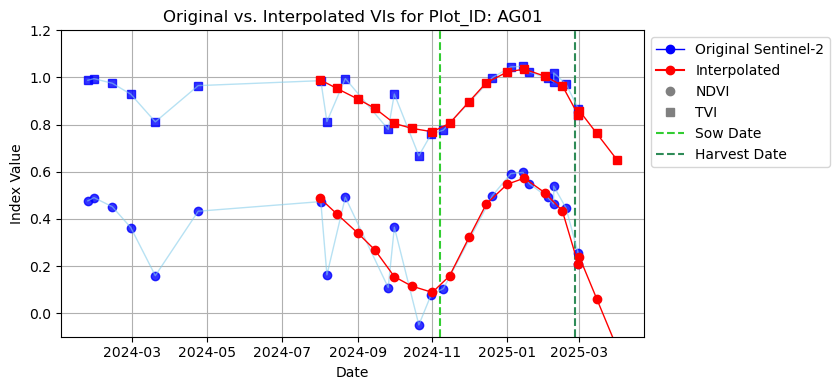

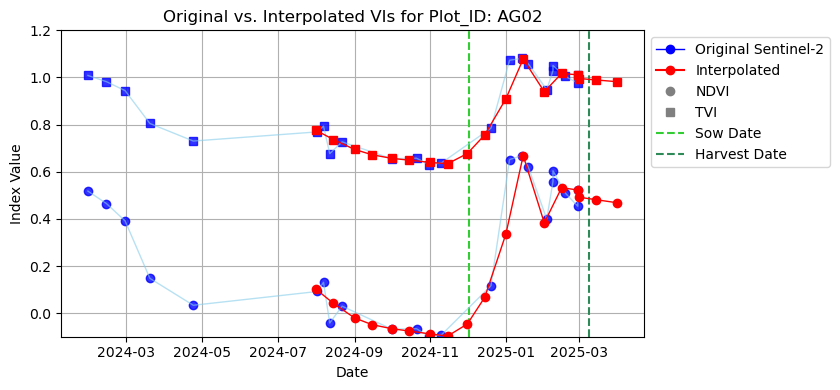

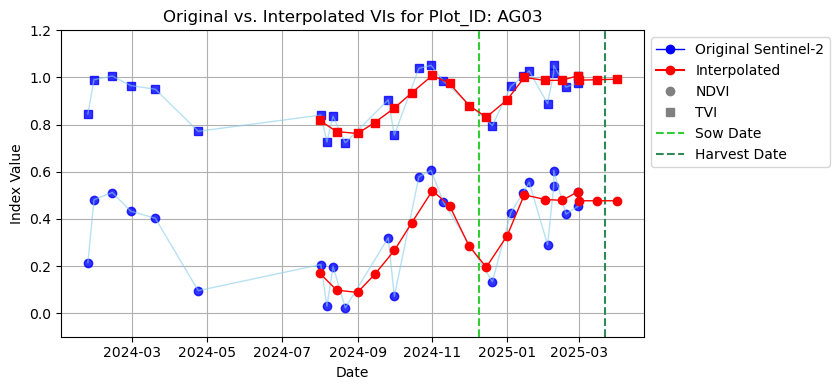

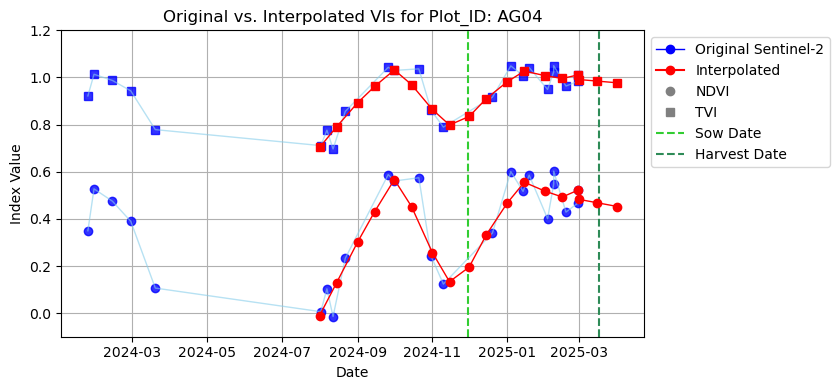

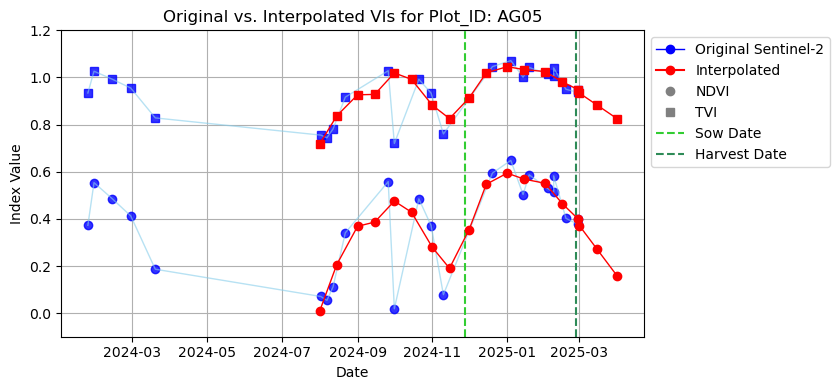

...

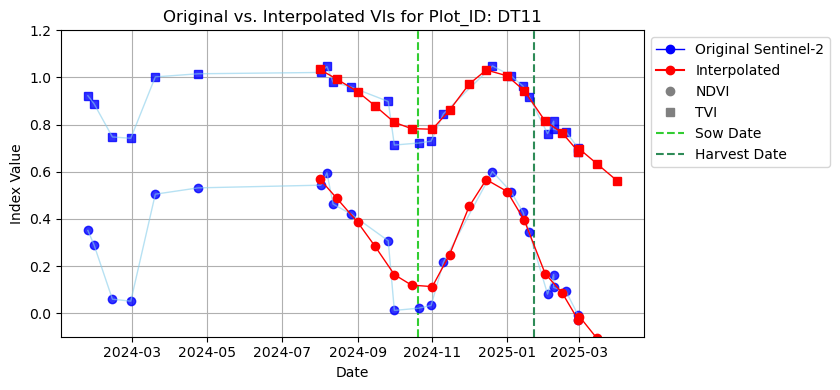

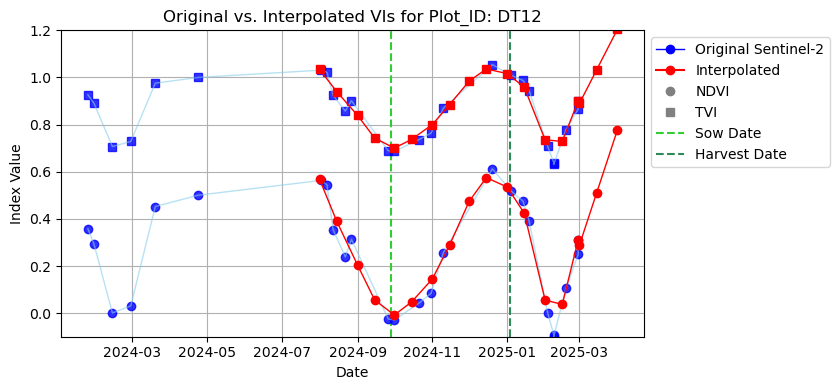

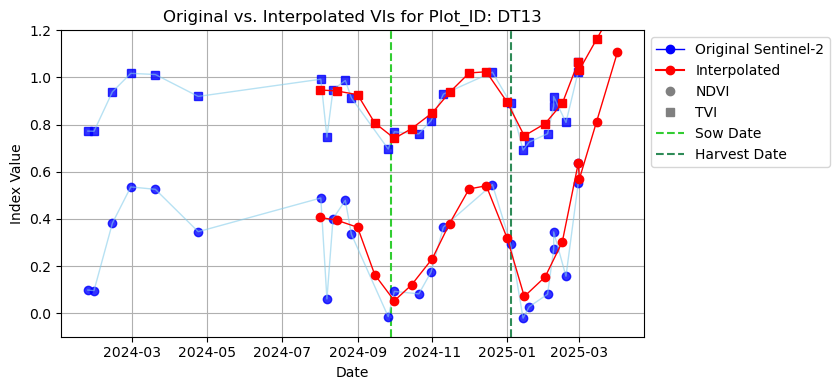

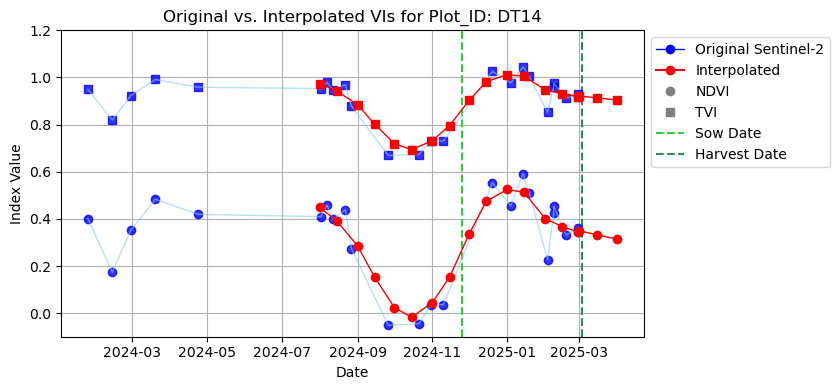

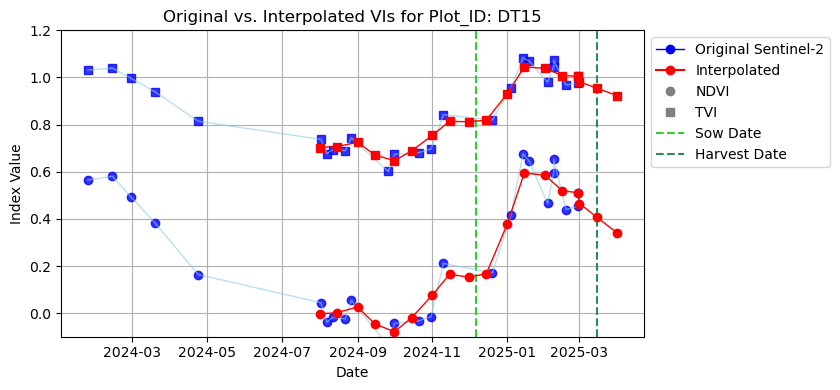

In [319]:
# Ensure 'Date' is datetime for both dataframes
final_VI_df['Date'] = pd.to_datetime(final_VI_df['Date'], errors='coerce')
final_interpolated_smoothed_df['Date'] = pd.to_datetime(final_interpolated_smoothed_df['Date'], errors='coerce')

# List of specific vegetation indices to plot for comparison
plot_indices_comparison = ['NDVI', 'TVI']

# Define the start date for plotting
start_date_plot = pd.to_datetime('2024-08-01')
# Define the hardcoded end date for plotting (inclusive)
end_date_plot = pd.to_datetime('2025-04-01')

# Get unique IDs present in the interpolated dataframe (assuming these are the locations of interest)
unique_ids_interpolated = final_interpolated_smoothed_df['Plot_ID'].unique()

# Define colors and markers
original_color_line = 'skyblue'  # Color for the thin line connecting original points
original_color_points = 'blue' # Color for the original points
interpolated_color = 'red'
index_markers = {'NDVI': 'o', 'TVI': 's'}

# Loop through each unique Plot_ID and create a separate plot
for site_id in unique_ids_interpolated:
    # Filter original Sentinel-2 data for the current Plot_ID and date range
    original_subset_df = final_VI_df[(final_VI_df['Plot_ID'] == site_id) &
                                     (final_VI_df['Date'] <= end_date_plot)].sort_values(by='Date').copy()

    # Filter interpolated data for the current Plot_ID and date range
    interpolated_subset_df = final_interpolated_smoothed_df[(final_interpolated_smoothed_df['Plot_ID'] == site_id) &
                                                            (final_interpolated_smoothed_df['Date'] <= end_date_plot)].sort_values(by='Date').copy()

    # Skip if no data for this Plot_ID in the interpolated dataframe within the date range
    if interpolated_subset_df.empty:
        print(f"No interpolated data for Plot_ID: {site_id} within the date range. Skipping plot.")
        continue

    plt.figure(figsize=(10, 4))
    plt.title(f'Original vs. Interpolated VIs for Plot_ID: {site_id}')
    plt.xlabel('Date')
    plt.ylabel('Index Value')
    plt.grid(True)

    # Add vertical lines for SowDate and HarDate from yield_data
    # Find the corresponding row in yield_data for the current site_id
    yield_row = yield_data[yield_data['Plot_ID'] == site_id]

    if not yield_row.empty:
        # Assuming there's only one SowDate and HarDate per Plot_ID in yield_data
        sow_date_str = yield_row['SowDate'].iloc[0]
        har_date_str = yield_row['HarDate'].iloc[0]

        # Convert date strings to datetime objects
        try:
            sow_date = pd.to_datetime(sow_date_str, dayfirst=True)
        except:
            try:
                 sow_date = pd.to_datetime(sow_date_str, format='%m/%d/%Y')
            except:
                 sow_date = None # Could not parse SowDate

        try:
            har_date = pd.to_datetime(har_date_str, dayfirst=True)
        except:
            try:
                 har_date = pd.to_datetime(har_date_str, format='%m/%d/%Y')
            except:
                 har_date = None # Could not parse HarDate

        # Only plot SowDate and HarDate if they are within the specified plotting date range
        if sow_date and sow_date <= end_date_plot:
            plt.axvline(sow_date, color='limegreen', linestyle='--', label='Sow Date')
        if har_date and har_date <= end_date_plot:
            plt.axvline(har_date, color='seagreen', linestyle='--', label='Harvest Date')

    # Set axis limits
    # plt.xlim(start_date_plot, end_date_plot)
    plt.ylim(-0.1, 1.2)
    
    # Plot original Sentinel-2 data points and thin lines
    if not original_subset_df.empty:
        for index in plot_indices_comparison:
            if index in original_subset_df.columns and not original_subset_df[index].dropna().empty:
                # Plot the points
                plt.plot(original_subset_df['Date'], original_subset_df[index],
                         marker=index_markers.get(index, 'o'), linestyle='None', linewidth=1, markersize=6,
                         color=original_color_points, alpha=0.8, label=f'Original Sentinel-2 Points - {index}')
                # Plot the thin line
                plt.plot(original_subset_df['Date'], original_subset_df[index],
                         marker='None', linestyle='-', linewidth=1,
                         color=original_color_line, alpha=0.6)


    # Plot interpolated data points (as lines connecting the 1st and 15th points)
    if not interpolated_subset_df.empty:
        for index in plot_indices_comparison:
            if index in interpolated_subset_df.columns and not interpolated_subset_df[index].dropna().empty:
                 plt.plot(interpolated_subset_df['Date'], interpolated_subset_df[index],
                         marker=index_markers.get(index, 'o'), linestyle='-', linewidth=1, markersize=6,
                         color=interpolated_color, label=f'Interpolated - {index}')

    # Create custom legend handles for clarity
    legend_handles = []
    # Add handles for sources and interpolation
    # Update the legend handle for original data to reflect both points and line conceptually
    legend_handles.append(plt.Line2D([], [], color=original_color_points, linestyle='-', marker='o', linewidth=1, label='Original Sentinel-2')) # Combined representation
    legend_handles.append(plt.Line2D([], [], color=interpolated_color, linestyle='-', marker='o', label='Interpolated'))
    # Add handles for indices with their markers (using a neutral color like gray for the index markers)
    for index in plot_indices_comparison:
        legend_handles.append(plt.Line2D([], [], color='gray', marker=index_markers.get(index, 'o'), linestyle='None', label=index))
    # Add handles for the vertical lines
    legend_handles.append(plt.Line2D([], [], color='limegreen', linestyle='--', label='Sow Date'))
    legend_handles.append(plt.Line2D([], [], color='seagreen', linestyle='--', label='Harvest Date'))

    plt.legend(handles=legend_handles, loc='upper left', bbox_to_anchor=(1,1))
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make space for legend
    plt.show()

# Merging the VI data and yield data.

In [320]:
# Merge the interpolated data with yield data based on 'Plot_ID'
# Using a left merge to keep all rows from the interpolated data
merged_result = pd.merge(final_interpolated_smoothed_df, yield_data, on='Plot_ID', how='left')

# Drop columns containing 'latitude' or 'longitude'
cols_to_drop = [col for col in merged_result.columns if 'latitude' in col or 'longitude' in col]
merged_result = merged_result.drop(columns=cols_to_drop)

# Display the head and shape of the merged DataFrame
print("Merged DataFrame (Interpolated Data + Yield Data) with lat/lon columns dropped:")
display(merged_result.head())
print("\nShape of merged_result:", merged_result.shape)

Merged DataFrame (Interpolated Data + Yield Data) with lat/lon columns dropped:


,Plot_ID,Date,Source,Crop,ARI,CIG,DVI,EVI,GNDVI,MSAVI,...,SAVI,TVI,VARI,WDRVI,SowDate,HarDate,Variety,YieldPrevious,YieldCurrent,CropSeasonDays
0,AG01,2024-08-01,Sentinel2-GEE,Rice,-1.091509,1.156166,0.276132,0.571542,0.396442,0.359074,...,0.376397,0.991385,0.192425,-0.571794,2024-11-07,2025-02-25,Japan,6.8,8.8,110
1,AG01,2024-08-15,Sentinel2-GEE,Rice,-0.875000,1.047035,0.239821,0.506455,0.341849,0.315809,...,0.329812,0.953804,0.157188,-0.604509,2024-11-07,2025-02-25,Japan,6.8,8.8,110
2,AG01,2024-09-01,Sentinel2-GEE,Rice,-0.619098,0.933166,0.199236,0.437849,0.277653,0.267215,...,0.276568,0.909042,0.114404,-0.641699,2024-11-07,2025-02-25,Japan,6.8,8.8,110
3,AG01,2024-09-15,Sentinel2-GEE,Rice,-0.417500,0.833187,0.164049,0.379129,0.220980,0.223872,...,0.229004,0.869646,0.079233,-0.674113,2024-11-07,2025-02-25,Japan,6.8,8.8,110
4,AG01,2024-10-01,Sentinel2-GEE,Rice,-0.155743,0.557536,0.100187,0.252755,0.117402,0.136382,...,0.138594,0.805293,0.035259,-0.735195,2024-11-07,2025-02-25,Japan,6.8,8.8,110



Shape of merged_result: (800, 24)


# This function takes the results_averaged dataframe and the period of analysis (in months) as the input. It reads the sowing date from the merged_result df and then creates another dataframe with the VIs corresponding to the value of num_months.

In [321]:
def select_vi_data_after_sowing(df, num_months):
    """
    Selects vegetation index data after the sowing date for a specified number of months.

    Args:
        df: The input DataFrame containing VI data, yield information, and dates.
        num_months: The number of months after the sowing date to select VI data for.

    Returns:
        A new DataFrame with selected and renamed VI columns, along with location and yield info.
    """

    processed_rows = []

    # List of vegetation indices
    indices_list = ['ARI', 'CIG', 'DVI', 'EVI', 'GNDVI', 'MSAVI','NDVI', 'NDWI', 'PRI', 'RVI', 'SAVI', 'TVI','VARI', 'WDRVI']

    # Identify all VI columns in the DataFrame
    # This now needs to be done dynamically based on current df columns, as original VI columns might have been interpolated
    # We can check for columns that are not the identifying/yield columns
    identifying_cols = ['Plot_ID', 'Date', 'Source', 'Crop', 'SowDate', 'HarDate', 'Variety', 'YieldPrevious', 'YieldCurrent']
    all_vi_columns = [col for col in df.columns if col not in identifying_cols]

    for index, row in df.iterrows():
        # Extract SowDate and convert to datetime
        sow_date_str = row['SowDate']

        # Attempt to parse date with potential different formats
        try:
            sow_date = pd.to_datetime(sow_date_str, dayfirst=True)
        except:
            try:
                 sow_date = pd.to_datetime(sow_date_str, format='%m/%d/%Y')
            except:
                 print(f"Could not parse SowDate: {sow_date_str} for row {index}. Skipping row.")
                 continue

        # Calculate the end date for selection
        # Add the specified number of months to the sowing date
        end_date = sow_date + pd.DateOffset(months=int(np.floor(num_months)))
        # For fractional months, calculate days and add. Assuming 30 days per month for simplicity in addition.
        # A more precise method might consider actual days in months.
        fractional_days = (num_months - int(np.floor(num_months))) * 30
        end_date = end_date + pd.Timedelta(days=int(fractional_days))

        # Filter data for the current row based on Date and within the date range after sowing
        row_data_subset = row.to_frame().T # Convert the row Series to a DataFrame for easier filtering by Date
        row_data_subset['Date'] = pd.to_datetime(row_data_subset['Date']) # Ensure Date is datetime for comparison


        # Select columns for each index name where date falls within the sow_date to end_date range
        selected_vi_data = {}
        for idx_name in indices_list:
             # Find columns in the current row that start with the VI name and have a date part
             # Assuming interpolated columns are named like VI_YYYYMMDD
             idx_cols_with_dates = []
             for col in row_data_subset.columns:
                 if col.startswith(idx_name) and len(col) > len(idx_name): # Check if there's a potential date suffix
                     try:
                         # Attempt to extract date from column name (assuming YYYYMMDD format after VI name)
                         date_part_str = col[len(idx_name):]
                         col_date = pd.to_datetime(date_part_str, format='%Y%m%d')
                         if col_date >= sow_date and col_date <= end_date:
                             idx_cols_with_dates.append((col_date, col)) # Store as (date, column_name)
                     except:
                         # If date extraction/parsing fails, ignore this column for this VI name
                         continue

             # Sort columns by date
             idx_cols_with_dates.sort()

             # Extract only the column names after sorting
             sorted_idx_col_names = [col_name for date, col_name in idx_cols_with_dates]

             # Select the first num_months * 2 columns for this index (assuming bi-monthly data)
             num_cols_to_select_per_index = int(num_months * 2)
             selected_vi_data[idx_name] = sorted_idx_col_names[:num_cols_to_select_per_index]

        # Create a dictionary for the new row data
        # Exclude latitude, longitude, and MLID as they were dropped
        new_row_data = {
            'Plot_ID': row['Plot_ID'],
            'SowDate': row['SowDate'],
            'HarDate': row['HarDate'],
            'Variety': row['Variety'], # Include Variety
            'YieldPrevious': row['YieldPrevious'], # Include YieldPrevious
            'YieldCurrent': row['YieldCurrent']
        }

        # Add selected and renamed VI columns to the new row data
        for idx_name in indices_list:
            cols_for_row = selected_vi_data[idx_name]
            for i, col in enumerate(cols_for_row):
                new_col_name = f"{idx_name}{i+1}"
                new_row_data[new_col_name] = row[col] # Access the value from the original row Series

        processed_rows.append(new_row_data)

    # Create the new DataFrame from the processed rows
    new_df = pd.DataFrame(processed_rows)

    return new_df

In [322]:
# Call the function with merged_result and user defined num_months
num_months = 3.0 # Define the number of months to be analyzed after the sowing date.
selected_data = select_vi_data_after_sowing(merged_result, num_months)

# Display the resulting DataFrame
print(f"DataFrame with selected VI data for {num_months} months after sowing:")
print(selected_data.shape)
selected_data.head(5)

DataFrame with selected VI data for 3.0 months after sowing:
(800, 6)


,Plot_ID,SowDate,HarDate,Variety,YieldPrevious,YieldCurrent
0,AG01,2024-11-07,2025-02-25,Japan,6.8,8.8
1,AG01,2024-11-07,2025-02-25,Japan,6.8,8.8
2,AG01,2024-11-07,2025-02-25,Japan,6.8,8.8
3,AG01,2024-11-07,2025-02-25,Japan,6.8,8.8
4,AG01,2024-11-07,2025-02-25,Japan,6.8,8.8


In [323]:
# Check if there are any NA values in the DataFrame
if selected_data.isnull().any().any():
    # Drop rows with any NA values
    selected_data = selected_data.dropna()
    print("Dropped rows with NA values from selected_data.")
else:
    print("No NA values found in selected_data. No rows were dropped.")

No NA values found in selected_data. No rows were dropped.


# Transposing the dates (as rows) in the merged dataframe to column headers such as ARI1 for the first date, ARI2 for the second date and so on. The number of rows are fixed to the number of field sites: 40 in the case of rice.   

In [324]:
# List of vegetation indices
vi_columns = ['ARI', 'CIG', 'DVI', 'EVI', 'GNDVI', 'MSAVI','NDVI', 'NDWI', 'PRI', 'RVI', 'SAVI', 'TVI','VARI', 'WDRVI']

processed_data_list = []

# Get unique IDs from yield_data to ensure we have a row for each Plot_ID present in yield_data
unique_yield_ids = yield_data['Plot_ID'].unique()

# Loop through each unique Plot_ID present in the yield_data
for site_id in unique_yield_ids:
    # Filter merged_result for the current site Plot_ID
    site_data = merged_result[merged_result['Plot_ID'] == site_id].sort_values(by='Date').copy()

    if site_data.empty:
        print(f"No data found in merged_result for Plot_ID: {site_id}. Skipping.")
        continue

    # Initialize a dictionary for the new row data for this Plot_ID
    # Take the first available Date, Source, and Crop as representative for this Plot_ID
    representative_row = site_data.iloc[0]
    new_row_data = {
        'Plot_ID': site_id,
        'Date': representative_row['Date'], # Representative date (e.g., first date)
        'Source': representative_row['Source'], # Representative source
        'Crop': representative_row['Crop'] # Representative crop
    }

    # Flatten VI data into sequential columns
    for vi in vi_columns:
        if vi in site_data.columns:
            # Get all non-null values for the current VI for this site, sorted by date
            vi_values = site_data.dropna(subset=[vi])[vi].tolist()

            # Add sequentially named columns for this VI
            for i, value in enumerate(vi_values):
                new_col_name = f"{vi}{i+1}"
                new_row_data[new_col_name] = value
        else:
             # If the VI column doesn't exist for this site (shouldn't happen with current data but good practice)
             # or if all values are NaN, no columns for this VI will be added for this Plot_ID.
             pass


    # Add yield and other relevant columns from the first row (assuming they are consistent per Plot_ID)
    # Need to handle cases where these columns might not exist or have NaNs
    for col in ['SowDate', 'HarDate', 'Variety', 'YieldPrevious', 'YieldCurrent']:
        if col in representative_row:
             new_row_data[col] = representative_row[col]
        else:
             new_row_data[col] = np.nan # Or some other placeholder if column missing

    # Append the new row data dictionary to the list
    processed_data_list.append(new_row_data)

# Create the final flattened DataFrame
flattened_df = pd.DataFrame(processed_data_list)

# Ensure columns are in a logical order (optional but good for readability)
# Start with Plot_ID, Date, Source, Crop, then yield/sowing info, then VI columns
ordered_columns = ['Plot_ID', 'Date', 'Source', 'Crop', 'SowDate', 'HarDate', 'Variety', 'YieldPrevious', 'YieldCurrent']
# Add all the flattened VI columns that were created - Corrected list comprehension
flattened_vi_cols = []
for vi in vi_columns:
    flattened_vi_cols.extend([col for col in flattened_df.columns if col.startswith(vi) and col not in ordered_columns])

# Sort flattened VI columns for better structure (e.g., ARI1, ARI2, ..., CIG1, CIG2, ...)
flattened_vi_cols.sort()
ordered_columns.extend(flattened_vi_cols)

# Filter out columns that might not exist in the final DataFrame due to missing VIs etc.
ordered_columns = [col for col in ordered_columns if col in flattened_df.columns]

flattened_df = flattened_df[ordered_columns]
selected_data = flattened_df

print("Flattened DataFrame:")
display(flattened_df.head())
print("\nShape of flattened_df:", flattened_df.shape)

Flattened DataFrame:


,Plot_ID,Date,Source,Crop,SowDate,HarDate,Variety,YieldPrevious,YieldCurrent,ARI1,...,WDRVI19,WDRVI2,WDRVI20,WDRVI3,WDRVI4,WDRVI5,WDRVI6,WDRVI7,WDRVI8,WDRVI9
0,DT01,2024-08-01,Sentinel2-GEE,Rice,2024-10-07,2025-01-15,OM18,6.0,7.1,-1.402145,...,0.176656,-0.589537,0.378121,-0.691945,-0.771820,-0.794235,-0.744180,-0.674012,-0.601600,-0.499350
1,DT02,2024-08-01,Sentinel2-GEE,Rice,2024-10-10,2025-01-25,OM18,5.4,7.0,-0.788293,...,-0.855193,-0.633742,-0.876665,-0.695668,-0.750643,-0.797265,-0.807165,-0.809633,-0.727455,-0.518911
2,DT03,2024-08-01,Sentinel2-GEE,Rice,2024-10-08,2025-01-15,OM18,6.2,8.3,-0.685320,...,0.326571,-0.735956,0.570454,-0.825056,-0.834923,-0.826231,-0.764549,-0.656706,-0.520498,-0.442989
3,DT04,2024-08-01,Sentinel2-GEE,Rice,2024-10-18,2025-01-17,OM18,6.9,7.8,-1.008408,...,0.011662,-0.619987,0.196568,-0.729796,-0.799692,-0.823361,-0.761709,-0.658547,-0.546649,-0.483048
4,DT05,2024-08-01,Sentinel2-GEE,Rice,2024-10-17,2025-01-15,OM18,6.9,8.1,-0.851755,...,0.444734,-0.471293,0.721286,-0.614882,-0.759145,-0.804725,-0.756864,-0.598411,-0.435661,-0.410665



Shape of flattened_df: (40, 289)


# Split and Scale data

In [325]:
# Features (X) are the vegetation indices
X = selected_data.drop(columns=['Plot_ID',	'Date', 'Source', 'Crop', 'SowDate',	'HarDate', 'Variety', 'YieldPrevious'])

# Target (y) is the Yield current
y = selected_data['YieldCurrent']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Feature Scaling
X_scaled = StandardScaler().fit_transform(X)
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [326]:
print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

Training set shape: (28, 281) (28,)
Testing set shape: (12, 281) (12,)


# Train Models

In [327]:
# Parameter grids for Hyperparameter Tuning

pcaVar = 0.999

param_grid_dt = {'max_depth': [None, 3, 5, 10], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2]}
param_grid_ridge = {'alpha': [1, 2, 4, 6, 10]}
param_grid_lasso = {'alpha': [0.01, 0.1, 0.5, 1, 2]}
param_grid_gbr = {'n_estimators': [10, 20, 50, 100, 200], 'learning_rate': [0.01, 0.1, 0.5, 1], 'max_depth': [1, 2, 3, 5, 10, 20]}
param_grid_rf = {'n_estimators': [5, 10, 20, 50, 100, 200], 'max_depth': [None, 1, 2, 5, 10, 20, 30], 'min_samples_split': [1, 2, 3, 5, 10]}
param_grid_xgb = {'n_estimators': [50, 100, 200, 300], 'learning_rate': [0.01, 0.01, 0.1, 0.25, 0.5], 'max_depth': [1,2, 3, 5]}
param_grid_svm = {'C': [0.5, 1, 3, 10, 30, 100, 300], 'epsilon': [0.01, 0.03, 0.1, 0.3, 1.0], 'gamma': ["scale", 0.01, 0.03, 0.1, 0.3, 1, 3], 'kernel': ['rbf', 'sigmoid', 'poly']}
param_grid_mlp = {'hidden_layer_sizes': [(8,), (16,), (32,), (64,), (8, 8), (16, 16), (32, 32), (64, 64), (8, 8, 8), (16, 16, 16), (32, 32, 32), (64, 64, 64)],
                      'activation': ['logistic', 'relu', 'tanh'], 'solver': ['adam', 'sgd'], 'alpha': [0.001, 0.01, 0.1]}

In [328]:
def DoModelEvalPrint(obs_vals, pred_vals, modelName, doScale, doPCA):
    if doScale:
        modelName += " | Scaled" + (" + PCA" if doPCA else "")
    elif doPCA:
        modelName += " | PCA"

    obs_vals = np.array(obs_vals).flatten()
    pred_vals = np.array(pred_vals).flatten()
    assert obs_vals.shape == pred_vals.shape

    r2_val = round(r2_score(obs_vals, pred_vals), 2)
    rmse_val = np.sqrt(mean_squared_error(obs_vals, pred_vals))
    mae_val = mean_absolute_error(obs_vals, pred_vals)
    rmae_val = round(mae_val / np.mean(obs_vals) * 100, 1);
    rrmse_val = round(rmse_val / np.mean(obs_vals) * 100, 1);
    print(f"{modelName} R2: {r2_val:.3f}")
    print(f"{modelName} MAE: {mae_val:.3f}")
    print(f"{modelName} RMAE: {rmae_val:.1f}%")
    print(f"{modelName} RMSE: {rmse_val:.3f}")
    print(f"{modelName} RRMSE: {rrmse_val:.1f}%\n")
    return r2_val, rmse_val, mae_val, rrmse_val, rmae_val


def DoModelEvalPlot(obs_vals, pred_vals, modelName, doScale, doPCA, pred_vals2=None, modelName2=None, figSize=(4, 4)):
    plt.figure(figsize=figSize)
    sns.scatterplot(x=obs_vals, y=pred_vals, label=modelName if modelName2 is not None else None)

    if pred_vals2 is not None:
        sns.scatterplot(x=obs_vals, y=pred_vals2, label=modelName2)

    if doScale:
        modelName += " | Scaled" + (" + PCA" if doPCA else "")
    elif doPCA:
        modelName += " | PCA"

    # Add 1:1 line
    min_val = min(min(obs_vals), min(pred_vals if pred_vals2 is None else np.concatenate([pred_vals, pred_vals2])))
    max_val = max(max(obs_vals), max(pred_vals if pred_vals2 is None else np.concatenate([pred_vals, pred_vals2])))

    plt.plot([min_val, max_val], [min_val, max_val], linestyle='dotted', color='red', label='1:1 line')

    plt.xlabel("Actual Yield")
    plt.ylabel("Predicted Yield")
    plt.title(f"{modelName}")
    plt.grid(True)
    plt.axis('square')  # Ensures aspect ratio is 1:1
    plt.legend()
    plt.show()


def DoModelTrain(X_train, X_test, y_train, y_test, X_train_scaled, X_test_scaled, doScale=False, doPCA=False):

    if (doScale):
        xTrain = X_train_scaled
        xTest = X_test_scaled
    else:
        xTrain = X_train
        xTest = X_test

    if (doPCA):
        pca = PCA(n_components=pcaVar, random_state=42).fit(xTrain)
        xTrain = pca.transform(xTrain)
        xTest = pca.transform(xTest)
        print(f"Dimention of the training dataset after PCA: {xTrain.shape}")

    print("\n--- Training Linear Regression Model ---")
    linear_model = LinearRegression()
    linear_model.fit(xTrain, y_train)
    y_pred_linear = linear_model.predict(xTest)
    r2_linear, rmse_linear, mae_linear, rrmse_linear, rmae_linear = DoModelEvalPrint(y_test, y_pred_linear, "Linear Regression", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_linear, "Linear Regression", doScale, doPCA)

    # 2. Hyperparameter Tuning using GridSearchCV

    print("\n--- Hyperparameter Tuning for Decision Tree Regressor ---")
    grid_search_dt = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid_dt, cv=4, scoring='r2', n_jobs=-1)
    grid_search_dt.fit(xTrain, y_train) # Using unscaled data
    best_dt_model = grid_search_dt.best_estimator_
    print("Best parameters for Decision Tree Regressor:", grid_search_dt.best_params_)
    y_pred_best_dt = best_dt_model.predict(xTest)
    r2_best_dt, rmse_best_dt, mae_best_dt, rrmse_best_dt, rmae_best_dt = DoModelEvalPrint(y_test, y_pred_best_dt, "Decision Tree", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_dt, "Decision Tree", doScale, doPCA)

    print("\n--- Hyperparameter Tuning for Gradient Boosting Regression ---")
    grid_search_gbr = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gbr, cv=4, scoring='r2', n_jobs=-1)
    grid_search_gbr.fit(xTrain, y_train) # Using unscaled data
    best_gbr_model = grid_search_gbr.best_estimator_
    print("Best parameters for Gradient Boosting Regression:", grid_search_gbr.best_params_)
    y_pred_best_gbr = best_gbr_model.predict(xTest)
    r2_best_gbr, rmse_best_gbr, mae_best_gbr, rrmse_best_gbr, rmae_best_gbr = DoModelEvalPrint(y_test, y_pred_best_gbr, "Gradient Boosting", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_gbr, "Gradient Boosting", doScale, doPCA)

    print("\n--- Hyperparameter Tuning for Ridge Regression ---")
    grid_search_ridge = GridSearchCV(Ridge(), param_grid_ridge, cv=4, scoring='r2', n_jobs=-1)
    grid_search_ridge.fit(xTrain, y_train) # Using unscaled data
    best_ridge_model = grid_search_ridge.best_estimator_
    print("Best parameters for Ridge Regression:", grid_search_ridge.best_params_)
    y_pred_best_ridge = best_ridge_model.predict(xTest)
    r2_best_ridge, rmse_best_ridge, mae_best_ridge, rrmse_best_ridge, rmae_best_ridge = DoModelEvalPrint(y_test, y_pred_best_ridge, "Ridge Regression", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_ridge, "Ridge Regression", doScale, doPCA)

    print("\n--- Hyperparameter Tuning for Lasso Regression ---")
    grid_search_lasso = GridSearchCV(Lasso(), param_grid_lasso, cv=4, scoring='r2', n_jobs=-1)
    grid_search_lasso.fit(xTrain, y_train) # Using unscaled data
    best_lasso_model = grid_search_lasso.best_estimator_
    print("Best parameters for Lasso Regression:", grid_search_lasso.best_params_)
    y_pred_best_lasso = best_lasso_model.predict(xTest)
    r2_best_lasso, rmse_best_lasso, mae_best_lasso, rrmse_best_lasso, rmae_best_lasso = DoModelEvalPrint(y_test, y_pred_best_lasso, "Lasso Regression", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_lasso, "Lasso Regression", doScale, doPCA)

    print("\n--- Hyperparameter Tuning for Random Forest ---")
    grid_search_rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=4, scoring='r2', n_jobs=-1)
    grid_search_rf.fit(xTrain, y_train) # Using unscaled data
    best_rf_model = grid_search_rf.best_estimator_
    print("Best parameters for Random Forest:", grid_search_rf.best_params_)
    y_pred_best_rf = best_rf_model.predict(xTest)
    r2_best_rf, rmse_best_rf, mae_best_rf, rrmse_best_rf, rmae_best_rf = DoModelEvalPrint(y_test, y_pred_best_rf, "Random Forest", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_rf, "Random Forest", doScale, doPCA)

    print("\n--- Hyperparameter Tuning for XGBoost ---")
    grid_search_xgb = GridSearchCV(xgb.XGBRegressor(objective='reg:squarederror', random_state=42), param_grid_xgb, cv=4, scoring='r2', n_jobs=-1)
    grid_search_xgb.fit(xTrain, y_train) # Using unscaled data
    best_xgb_model = grid_search_xgb.best_estimator_
    print("Best parameters for XGBoost:", grid_search_xgb.best_params_)
    y_pred_best_xgb = best_xgb_model.predict(xTest)
    r2_best_xgb, rmse_best_xgb, mae_best_xgb, rrmse_best_xgb, rmae_best_xgb = DoModelEvalPrint(y_test, y_pred_best_xgb, "XGBoost", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_xgb, "XGBoost", doScale, doPCA)

    # Tuning for SVR (requires scaled data)
    print("\n--- Hyperparameter Tuning for SVR ---")
    grid_search_svm = GridSearchCV(SVR(), param_grid_svm, cv=5, scoring='r2', n_jobs=-1)
    grid_search_svm.fit(xTrain, y_train) # Using scaled data
    best_svm_model = grid_search_svm.best_estimator_
    print("Best parameters for SVR:", grid_search_svm.best_params_)
    y_pred_best_svm = best_svm_model.predict(xTest)
    r2_best_svm, rmse_best_svm, mae_best_svm, rrmse_best_svm, rmae_best_svm = DoModelEvalPrint(y_test, y_pred_best_svm, "SVR", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_svm, "SVR", doScale, doPCA)

    # Tuning for MLP (requires scaled data)
    print("\n--- Hyperparameter Tuning for MLP ---")
    # Note: MLP tuning can be computationally expensive and sensitive to max_iter
    grid_search_mlp = GridSearchCV(MLPRegressor(max_iter=500, random_state=42), param_grid_mlp, cv=4, scoring='r2', n_jobs=-1) # Reduced CV folds for faster tuning
    grid_search_mlp.fit(xTrain, y_train) # Using scaled data
    best_mlp_model = grid_search_mlp.best_estimator_
    print("Best parameters for MLP:", grid_search_mlp.best_params_)
    y_pred_best_mlp = best_mlp_model.predict(xTest)
    r2_best_mlp, rmse_best_mlp, mae_best_mlp, rrmse_best_mlp, rmae_best_mlp = DoModelEvalPrint(y_test, y_pred_best_mlp, "MLP", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_best_mlp, "MLP", doScale, doPCA)

    # 3. Ensemble Methods (Stacking/Averaging)

    # Voting Regressor
    voting_model = VotingRegressor(estimators=[('linear', linear_model), ('dt', best_dt_model), ('gbr', best_gbr_model),
											   ('ridge', best_ridge_model), ('lasso', best_lasso_model), ('rf', best_rf_model),
                                               ('xgb', best_xgb_model), ('svm', best_svm_model), ('mlp', best_mlp_model)],

                                   weights=[1/np.power(rrmse_linear,4), 1/np.power(rrmse_best_dt,4), 1/np.power(rrmse_best_gbr,4),
								            1/np.power(rrmse_best_ridge,4), 1/np.power(rrmse_best_lasso,4), 1/np.power(rrmse_best_rf,4),
                                            1/np.power(rrmse_best_xgb,4), 1/np.power(rrmse_best_svm,4), 1/np.power(rrmse_best_mlp,4)])
    voting_model.fit(xTrain, y_train)
    y_pred_voting = voting_model.predict(xTest)
    r2_voting, rmse_voting, mae_voting, rrmse_voting, rmae_voting = DoModelEvalPrint(y_test, y_pred_voting, "Voting Regressor", doScale, doPCA)
    DoModelEvalPlot(y_test, y_pred_voting, "Voting Regressor", doScale, doPCA)

    if (not doPCA):
        # Feature importance from Random Forest
        print("\n--- Feature Importance from Random Forest ---")
        if hasattr(best_rf, 'feature_importances_'):
            feature_importances = pd.Series(best_rf.feature_importances_, index=xTrain.columns)
            feature_importances_sorted = feature_importances.sort_values(ascending=False)
            # print(feature_importances_sorted)
            plt.figure(figsize=(12, 6))
            feature_importances_sorted.plot(kind='bar')
            plt.title("Feature Importances (Random Forest)")
            plt.ylabel("Importance")
            plt.tight_layout()
            plt.show()

    # --- Summary of Results ---
    print("\n--- Model Performance Summary ---")
    results = {
        "Linear Regression": {"R2": r2_linear, "RRMSE (%)": rrmse_linear, "RMAE (%)": rmae_linear},
        "Decision Tree": {"R2": r2_best_dt, "RRMSE (%)": rrmse_best_dt, "RMAE (%)": rmae_best_dt},
        "Gradient Boosting": {"R2": r2_best_gbr, "RRMSE (%)": rrmse_best_gbr, "RMAE (%)": rmae_best_gbr},
        "Ridge Regression": {"R2": r2_best_ridge, "RRMSE (%)": rrmse_best_ridge, "RMAE (%)": rmae_best_ridge},
        "Lasso Regression": {"R2": r2_best_lasso, "RRMSE (%)": rrmse_best_lasso, "RMAE (%)": rmae_best_lasso},
        "Random Forest": {"R2": r2_best_rf, "RRMSE (%)": rrmse_best_rf, "RMAE (%)": rmae_best_rf},
        "XGBoost": {"R2": r2_best_xgb, "RRMSE (%)": rrmse_best_xgb, "RMAE (%)": rmae_best_xgb},
        "SVM": {"R2": r2_best_svm, "RRMSE (%)": rrmse_best_svm, "RMAE (%)": rmae_best_svm},
        "MLP": {"R2": r2_best_mlp, "RRMSE (%)": rrmse_best_mlp, "RMAE (%)": rmae_best_mlp},
        "Voting Regressor": {"R2": r2_voting, "RRMSE (%)": rrmse_voting, "RMAE (%)": rmae_voting}
    }

    results_df = pd.DataFrame(results).T.sort_values(by='RRMSE (%)', ascending=True)
    return results_df

Dimention of the training dataset after PCA: (28, 24)

--- Training Linear Regression Model ---
Linear Regression | Scaled + PCA R2: 0.220
Linear Regression | Scaled + PCA MAE: 0.291
Linear Regression | Scaled + PCA RMAE: 3.4%
Linear Regression | Scaled + PCA RMSE: 0.436
Linear Regression | Scaled + PCA RRMSE: 5.1%



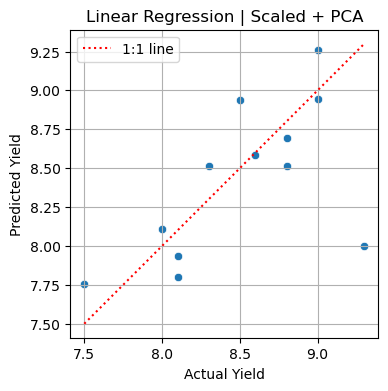


--- Hyperparameter Tuning for Decision Tree Regressor ---
Best parameters for Decision Tree Regressor: {'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2}
Decision Tree | Scaled + PCA R2: -0.450
Decision Tree | Scaled + PCA MAE: 0.477
Decision Tree | Scaled + PCA RMAE: 5.6%
Decision Tree | Scaled + PCA RMSE: 0.596
Decision Tree | Scaled + PCA RRMSE: 7.0%



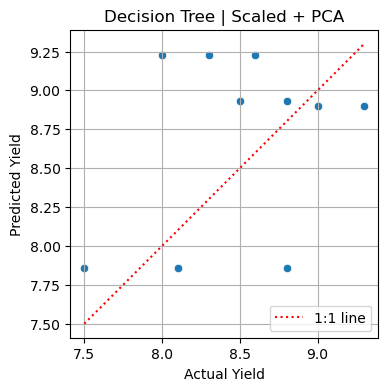


--- Hyperparameter Tuning for Gradient Boosting Regression ---
Best parameters for Gradient Boosting Regression: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}
Gradient Boosting | Scaled + PCA R2: -0.820
Gradient Boosting | Scaled + PCA MAE: 0.495
Gradient Boosting | Scaled + PCA RMAE: 5.8%
Gradient Boosting | Scaled + PCA RMSE: 0.667
Gradient Boosting | Scaled + PCA RRMSE: 7.8%



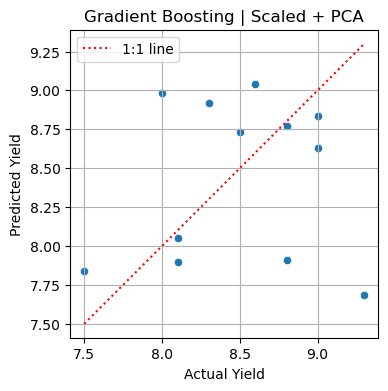


--- Hyperparameter Tuning for Ridge Regression ---
Best parameters for Ridge Regression: {'alpha': 1}
Ridge Regression | Scaled + PCA R2: 0.080
Ridge Regression | Scaled + PCA MAE: 0.328
Ridge Regression | Scaled + PCA RMAE: 3.9%
Ridge Regression | Scaled + PCA RMSE: 0.475
Ridge Regression | Scaled + PCA RRMSE: 5.6%



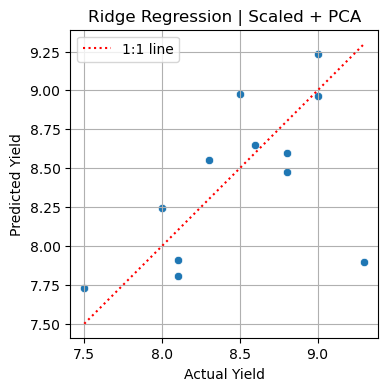


--- Hyperparameter Tuning for Lasso Regression ---
Best parameters for Lasso Regression: {'alpha': 1}
Lasso Regression | Scaled + PCA R2: 0.170
Lasso Regression | Scaled + PCA MAE: 0.374
Lasso Regression | Scaled + PCA RMAE: 4.4%
Lasso Regression | Scaled + PCA RMSE: 0.450
Lasso Regression | Scaled + PCA RRMSE: 5.3%



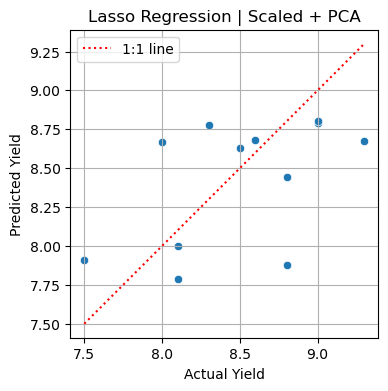


--- Hyperparameter Tuning for Random Forest ---
Best parameters for Random Forest: {'max_depth': 2, 'min_samples_split': 5, 'n_estimators': 50}
Random Forest | Scaled + PCA R2: -0.080
Random Forest | Scaled + PCA MAE: 0.434
Random Forest | Scaled + PCA RMAE: 5.1%
Random Forest | Scaled + PCA RMSE: 0.514
Random Forest | Scaled + PCA RRMSE: 6.0%



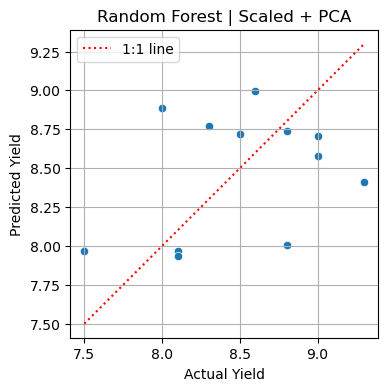


--- Hyperparameter Tuning for XGBoost ---
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 300}
XGBoost | Scaled + PCA R2: -0.180
XGBoost | Scaled + PCA MAE: 0.384
XGBoost | Scaled + PCA RMAE: 4.5%
XGBoost | Scaled + PCA RMSE: 0.537
XGBoost | Scaled + PCA RRMSE: 6.3%



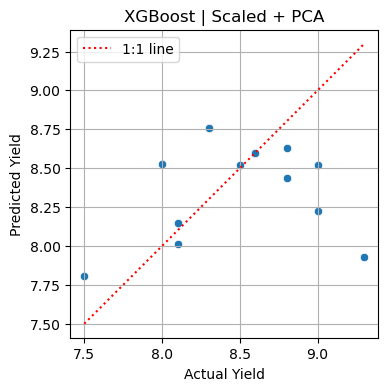


--- Hyperparameter Tuning for SVR ---
Best parameters for SVR: {'C': 0.5, 'epsilon': 0.03, 'gamma': 'scale', 'kernel': 'sigmoid'}
SVR | Scaled + PCA R2: -0.180
SVR | Scaled + PCA MAE: 0.451
SVR | Scaled + PCA RMAE: 5.3%
SVR | Scaled + PCA RMSE: 0.537
SVR | Scaled + PCA RRMSE: 6.3%



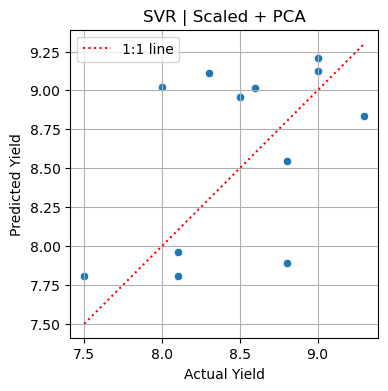


--- Hyperparameter Tuning for MLP ---
Best parameters for MLP: {'activation': 'logistic', 'alpha': 0.001, 'hidden_layer_sizes': (64, 64, 64), 'solver': 'adam'}
MLP | Scaled + PCA R2: -0.040
MLP | Scaled + PCA MAE: 0.407
MLP | Scaled + PCA RMAE: 4.8%
MLP | Scaled + PCA RMSE: 0.505
MLP | Scaled + PCA RRMSE: 5.9%



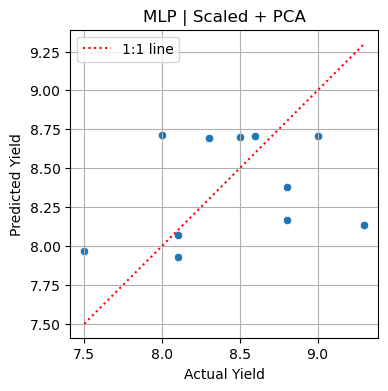

Voting Regressor | Scaled + PCA R2: 0.210
Voting Regressor | Scaled + PCA MAE: 0.357
Voting Regressor | Scaled + PCA RMAE: 4.2%
Voting Regressor | Scaled + PCA RMSE: 0.439
Voting Regressor | Scaled + PCA RRMSE: 5.2%



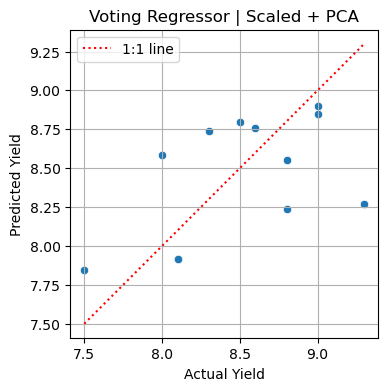


--- Model Performance Summary ---


,R2,RRMSE (%),RMAE (%)
Linear Regression,0.22,5.1,3.4
Voting Regressor,0.21,5.2,4.2
Lasso Regression,0.17,5.3,4.4
Ridge Regression,0.08,5.6,3.9
MLP,-0.04,5.9,4.8
Random Forest,-0.08,6.0,5.1
XGBoost,-0.18,6.3,4.5
SVM,-0.18,6.3,5.3
Decision Tree,-0.45,7.0,5.6
Gradient Boosting,-0.82,7.8,5.8


In [329]:
DoModelTrain(X_train, X_test, y_train, y_test, X_train_scaled, X_test_scaled, doScale=True, doPCA=True)

## Train Models with Leave-One-Out Cross Validation

In [330]:
def DoModelEvalCVPrint(model, X, y, modelName, doScale, doPCA):
    if doScale:
        modelName += " | Scaled" + (" + PCA" if doPCA else "")
    elif doPCA:
        modelName += " | PCA"

    # Perform Leave-One-Out Cross-Validation
    loo = LeaveOneOut()
    pred_vals = cross_val_predict(model, X, y, cv=loo, n_jobs=-1)
    r2_val = round(r2_score(y, pred_vals), 2)
    err_vals = -cross_val_score(model, X, y, cv=loo, scoring='neg_mean_absolute_error')
    mae_val = np.mean(np.abs(err_vals));
    rmse_val = np.sqrt(np.mean(np.power(err_vals,2)));
    rmae_val = round(mae_val / np.mean(y) * 100, 1)
    rrmse_val = round(rmse_val / np.mean(y) * 100, 1)

    final_model = model.fit(X, y)

    print(f"{modelName} LOOCV R2: {r2_val:.3f}")
    print(f"{modelName} LOOCV MAE: {mae_val:.3f}")
    print(f"{modelName} LOOCV RMAE: {rmae_val:.1f}%")
    print(f"{modelName} LOOCV RMSE: {rmse_val:.3f}")
    print(f"{modelName} LOOCV RRMSE: {rrmse_val:.1f}% \n")

    # You might not want to plot individual LOOCV predictions directly due to the nature of LOOCV (n predictions)
    # A scatter plot of actual vs. predicted values from a single train/test split is often more informative for visualization.
    # If you still want to visualize LOOCV results, you would need to predict for each fold and collect all predictions.
    # For simplicity, we'll skip the plot function call here for LOOCV results.

    return final_model, r2_val, rmse_val, mae_val, rrmse_val, rmae_val, pred_vals


def DoModelTrainCV(X, X_scaled, y, doScale, doPCA, figSize=(5,5)):

    if (doScale):
        xTrain = X_scaled
    else:
        xTrain = X

    if (doPCA):
        xTrain = PCA(n_components=pcaVar, random_state=42).fit_transform(xTrain)
        print(f"Dimention of the training dataset after PCA: {xTrain.shape}")

    print("\n--- Training Linear Regression Model ---")
    linear_model = LinearRegression()
    linear_model, r2_linear, rmse_linear, mae_linear, rrmse_linear, rmae_linear, y_pred_linear_loo = DoModelEvalCVPrint(linear_model, xTrain, y, "Linear Regression", doScale, doPCA)
    y_pred_linear = linear_model.predict(xTrain)
    DoModelEvalPrint(y, y_pred_linear, "Linear Regression", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_linear, "LR", doScale, doPCA, y_pred_linear_loo, "LOO-CV", figSize=figSize)

    # 2. Hyperparameter Tuning using GridSearchCV
    loo = LeaveOneOut()

    print("\n--- Hyperparameter Tuning for Decision Tree Regressor ---")
    grid_search_dt = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid_dt, cv=4, scoring='r2', n_jobs=-1)
    grid_search_dt.fit(xTrain, y)
    print("Best parameters for Decision Tree Regressor:", grid_search_dt.best_params_)
    dt_model = grid_search_dt.best_estimator_
    y_pred_dt = dt_model.fit(xTrain, y).predict(xTrain)
    dt_model, r2_dt, rmse_dt, mae_dt, rrmse_dt, rmae_dt, y_pred_dt_loo = DoModelEvalCVPrint(dt_model, xTrain, y, "Decision Tree", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_dt, "Decision Tree Regressor", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_dt, "DT", doScale, doPCA, y_pred_dt_loo, "LOO-CV", figSize=figSize)

    print("\n--- Hyperparameter Tuning for Ridge Regression ---")
    grid_search_ridge = GridSearchCV(Ridge(), param_grid_ridge, cv=4, scoring='r2', n_jobs=-1)
    grid_search_ridge.fit(xTrain, y)
    print("Best parameters for Ridge Regression:", grid_search_ridge.best_params_)
    ridge_model = grid_search_ridge.best_estimator_
    y_pred_ridge = ridge_model.fit(xTrain, y).predict(xTrain)
    ridge_model, r2_ridge, rmse_ridge, mae_ridge, rrmse_ridge, rmae_ridge, y_pred_ridge_loo = DoModelEvalCVPrint(ridge_model, xTrain, y, "Random Forest", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_ridge, "Ridge Regression", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_ridge, "Ridge", doScale, doPCA, y_pred_ridge_loo, "LOO-CV", figSize=figSize)

    print("\n--- Hyperparameter Tuning for Lasso Regression ---")
    grid_search_lasso = GridSearchCV(Lasso(), param_grid_lasso, cv=4, scoring='r2', n_jobs=-1)
    grid_search_lasso.fit(xTrain, y)
    print("Best parameters for Lasso Regression:", grid_search_lasso.best_params_)
    lasso_model = grid_search_lasso.best_estimator_
    y_pred_lasso = lasso_model.fit(xTrain, y).predict(xTrain)
    lasso_model, r2_lasso, rmse_lasso, mae_lasso, rrmse_lasso, rmae_lasso, y_pred_lasso_loo = DoModelEvalCVPrint(lasso_model, xTrain, y, "Lasso Regression", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_lasso, "Lasso Regression", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_lasso, "Lasso", doScale, doPCA, y_pred_lasso_loo, "LOO-CV", figSize=figSize)

    print("\n--- Hyperparameter Tuning for Gradient Boosting Regressor ---")
    grid_search_gbr = GridSearchCV(GradientBoostingRegressor(random_state=42), param_grid_gbr, cv=4, scoring='r2', n_jobs=-1)
    grid_search_gbr.fit(xTrain, y)
    print("Best parameters for Gradient Boosting Regressor:", grid_search_gbr.best_params_)
    gbr_model = grid_search_gbr.best_estimator_
    y_pred_gbr = gbr_model.fit(xTrain, y).predict(xTrain)
    gbr_model, r2_gbr, rmse_gbr, mae_gbr, rrmse_gbr, rmae_gbr, y_pred_gbr_loo = DoModelEvalCVPrint(gbr_model, xTrain, y, "Gradient Boosting", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_gbr, "Gradient Boosting", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_gbr, "GB", doScale, doPCA, y_pred_gbr_loo, "LOO-CV", figSize=figSize)

    print("\n--- Hyperparameter Tuning for Random Forest ---")
    grid_search_rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=4, scoring='r2', n_jobs=-1)
    grid_search_rf.fit(xTrain, y)
    print("Best parameters for Random Forest:", grid_search_rf.best_params_)
    rf_model = grid_search_rf.best_estimator_
    y_pred_rf = rf_model.fit(xTrain, y).predict(xTrain)
    rf_model, r2_rf, rmse_rf, mae_rf, rrmse_rf, rmae_rf, y_pred_rf_loo = DoModelEvalCVPrint(rf_model, xTrain, y, "Random Forest", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_rf, "Random Forest", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_rf, "RF", doScale, doPCA, y_pred_rf_loo, "LOO-CV", figSize=figSize)

    print("\n--- Hyperparameter Tuning for XGBoost ---")
    grid_search_xgb = GridSearchCV(xgb.XGBRegressor(objective='reg:squarederror', random_state=42), param_grid_xgb, cv=4, scoring='r2', n_jobs=-1)
    grid_search_xgb.fit(xTrain, y)
    print("Best parameters for XGBoost:", grid_search_xgb.best_params_)
    xgb_model = grid_search_xgb.best_estimator_
    y_pred_xgb = xgb_model.fit(xTrain, y).predict(xTrain)
    xgb_model, r2_xgb, rmse_xgb, mae_xgb, rrmse_xgb, rmae_xgb, y_pred_xgb_loo = DoModelEvalCVPrint(xgb_model, xTrain, y, "XGBoost", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_xgb, "XGBoost", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_xgb, "XGBoost", doScale, doPCA, y_pred_xgb_loo, "LOO-CV", figSize=figSize)

    # Tuning for SVR (requires scaled data)
    print("\n--- Hyperparameter Tuning for SVR ---")
    grid_search_svm = GridSearchCV(SVR(), param_grid_svm, cv=loo, scoring='r2', n_jobs=-1)
    grid_search_svm.fit(xTrain, y)
    print("Best parameters for SVR:", grid_search_svm.best_params_)
    svm_model = grid_search_svm.best_estimator_
    y_pred_svm = svm_model.fit(xTrain, y).predict(xTrain)
    svm_model, r2_svm, rmse_svm, mae_svm, rrmse_svm, rmae_svm, y_pred_svm_loo = DoModelEvalCVPrint(svm_model, xTrain, y, "SVR", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_svm, "SVR", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_svm, "SVR", doScale, doPCA, y_pred_svm_loo, "LOO-CV", figSize=figSize)

    # Tuning for MLP (requires scaled data)
    print("\n--- Hyperparameter Tuning for MLP ---")
    grid_search_mlp = GridSearchCV(MLPRegressor(max_iter=500, random_state=42), param_grid_mlp, cv=4, scoring='r2', n_jobs=-1)
    grid_search_mlp.fit(xTrain, y)
    print("Best parameters for MLP:", grid_search_mlp.best_params_)
    mlp_model = grid_search_mlp.best_estimator_
    y_pred_mlp = mlp_model.fit(xTrain, y).predict(xTrain)
    mlp_model, r2_mlp, rmse_mlp, mae_mlp, rrmse_mlp, rmae_mlp, y_pred_mlp_loo = DoModelEvalCVPrint(mlp_model, xTrain, y, "MLP", doScale, doPCA)
    DoModelEvalPrint(y, y_pred_mlp, "MLP", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_mlp, "MLP", doScale, doPCA, y_pred_mlp_loo, "LOO-CV", figSize=figSize)

    # 3. Ensemble Methods (Stacking/Averaging)

    # Voting Regressor
    preds = np.array([y_pred_linear, y_pred_dt, y_pred_gbr, y_pred_ridge, y_pred_lasso, y_pred_rf, y_pred_xgb, y_pred_svm, y_pred_mlp])
    preds_loo = np.array([y_pred_linear_loo, y_pred_dt_loo, y_pred_gbr_loo, y_pred_ridge_loo, y_pred_lasso_loo, y_pred_rf_loo, y_pred_xgb_loo, y_pred_svm_loo, y_pred_mlp_loo])
    rrmse_values = np.array([rrmse_linear, rrmse_dt, rrmse_gbr, rrmse_ridge, rrmse_lasso, rrmse_rf, rrmse_xgb, rrmse_svm, rrmse_mlp])
    weights = 1 / np.power(rrmse_values, 4)
    weights = weights / weights.sum()
    y_pred_voting = np.average(preds, axis=0, weights=weights)
    y_pred_loo_voting = np.average(preds_loo, axis=0, weights=weights)
    r2_voting, rmse_voting, mae_voting, rrmse_voting, rmae_voting = DoModelEvalPrint(y, y_pred_loo_voting, "Voting Regressor", doScale, doPCA)
    DoModelEvalPlot(y, y_pred_voting, "Voting Regressor", doScale, doPCA, y_pred_loo_voting, "LOO-CV", figSize=figSize)

    if (not doPCA):
        # Feature importance from Random Forest
        print("\n--- Feature Importance from Random Forest ---")
        if hasattr(best_rf, 'feature_importances_'):
            feature_importances = pd.Series(best_rf.feature_importances_, index=xTrain.columns)
            feature_importances_sorted = feature_importances.sort_values(ascending=False)
            # print(feature_importances_sorted)
            plt.figure(figsize=(12, 6))
            feature_importances_sorted.plot(kind='bar')
            plt.title("Feature Importances (Random Forest)")
            plt.ylabel("Importance")
            plt.tight_layout()
            plt.show()

    # --- Summary of Results ---
    print("\n--- Model Performance Summary with LOO-CV ---")
    results = {
        "Linear Regression": {"R2": r2_linear, "RRMSE (%)": rrmse_linear, "RMAE (%)": rmae_linear},
        "Decision Tree": {"R2": r2_dt, "RRMSE (%)": rrmse_dt, "RMAE (%)": rmae_dt},
        "Gradient Boosting": {"R2": r2_gbr, "RRMSE (%)": rrmse_gbr, "RMAE (%)": rmae_gbr},
        "Ridge Regression": {"R2": r2_ridge, "RRMSE (%)": rrmse_ridge, "RMAE (%)": rmae_ridge},
        "Lasso Regression": {"R2": r2_lasso, "RRMSE (%)": rrmse_lasso, "RMAE (%)": rmae_lasso},
        "Random Forest": {"R2": r2_rf, "RRMSE (%)": rrmse_rf, "RMAE (%)": rmae_rf},
        "XGBoost": {"R2": r2_xgb, "RRMSE (%)": rrmse_xgb, "RMAE (%)": rmae_xgb},
        "SVM": {"R2": r2_svm, "RRMSE (%)": rrmse_svm, "RMAE (%)": rmae_svm},
        "MLP": {"R2": r2_mlp, "RRMSE (%)": rrmse_mlp, "RMAE (%)": rmae_mlp},
        "Voting Regressor": {"R2": r2_voting, "RRMSE (%)": rrmse_voting, "RMAE (%)": rmae_voting}
    }

    results_df = pd.DataFrame(results).T.sort_values(by='RRMSE (%)', ascending=True)
    return results_df

Dimention of the training dataset after PCA: (40, 31)

--- Training Linear Regression Model ---
Linear Regression | Scaled + PCA LOOCV R2: 0.690
Linear Regression | Scaled + PCA LOOCV MAE: 0.196
Linear Regression | Scaled + PCA LOOCV RMAE: 2.3%
Linear Regression | Scaled + PCA LOOCV RMSE: 0.386
Linear Regression | Scaled + PCA LOOCV RRMSE: 4.6% 

Linear Regression | Scaled + PCA R2: 1.000
Linear Regression | Scaled + PCA MAE: 0.015
Linear Regression | Scaled + PCA RMAE: 0.2%
Linear Regression | Scaled + PCA RMSE: 0.022
Linear Regression | Scaled + PCA RRMSE: 0.3%



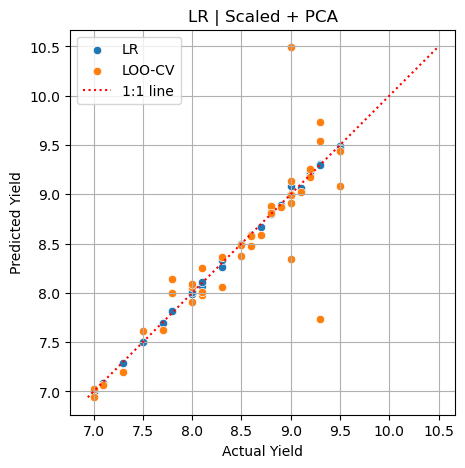


--- Hyperparameter Tuning for Decision Tree Regressor ---
Best parameters for Decision Tree Regressor: {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 2}
Decision Tree | Scaled + PCA LOOCV R2: 0.220
Decision Tree | Scaled + PCA LOOCV MAE: 0.465
Decision Tree | Scaled + PCA LOOCV RMAE: 5.5%
Decision Tree | Scaled + PCA LOOCV RMSE: 0.615
Decision Tree | Scaled + PCA LOOCV RRMSE: 7.3% 

Decision Tree Regressor | Scaled + PCA R2: 0.940
Decision Tree Regressor | Scaled + PCA MAE: 0.101
Decision Tree Regressor | Scaled + PCA RMAE: 1.2%
Decision Tree Regressor | Scaled + PCA RMSE: 0.166
Decision Tree Regressor | Scaled + PCA RRMSE: 2.0%



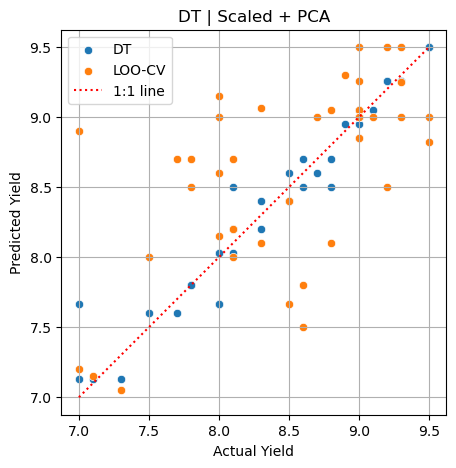


--- Hyperparameter Tuning for Ridge Regression ---
Best parameters for Ridge Regression: {'alpha': 1}
Random Forest | Scaled + PCA LOOCV R2: 0.910
Random Forest | Scaled + PCA LOOCV MAE: 0.135
Random Forest | Scaled + PCA LOOCV RMAE: 1.6%
Random Forest | Scaled + PCA LOOCV RMSE: 0.204
Random Forest | Scaled + PCA LOOCV RRMSE: 2.4% 

Ridge Regression | Scaled + PCA R2: 1.000
Ridge Regression | Scaled + PCA MAE: 0.024
Ridge Regression | Scaled + PCA RMAE: 0.3%
Ridge Regression | Scaled + PCA RMSE: 0.032
Ridge Regression | Scaled + PCA RRMSE: 0.4%



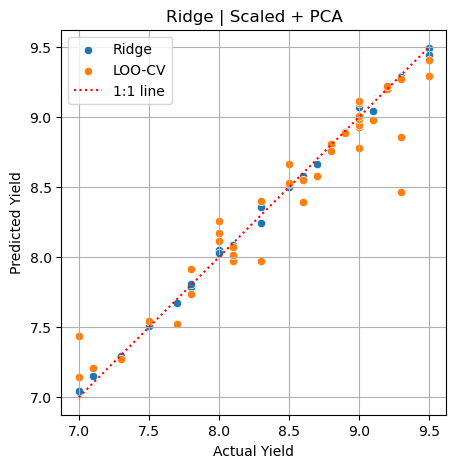


--- Hyperparameter Tuning for Lasso Regression ---
Best parameters for Lasso Regression: {'alpha': 0.01}
Lasso Regression | Scaled + PCA LOOCV R2: 0.770
Lasso Regression | Scaled + PCA LOOCV MAE: 0.242
Lasso Regression | Scaled + PCA LOOCV RMAE: 2.9%
Lasso Regression | Scaled + PCA LOOCV RMSE: 0.338
Lasso Regression | Scaled + PCA LOOCV RRMSE: 4.0% 

Lasso Regression | Scaled + PCA R2: 0.980
Lasso Regression | Scaled + PCA MAE: 0.067
Lasso Regression | Scaled + PCA RMAE: 0.8%
Lasso Regression | Scaled + PCA RMSE: 0.086
Lasso Regression | Scaled + PCA RRMSE: 1.0%



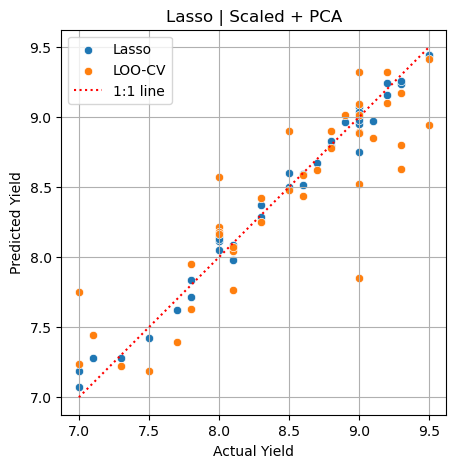


--- Hyperparameter Tuning for Gradient Boosting Regressor ---
Best parameters for Gradient Boosting Regressor: {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 200}
Gradient Boosting | Scaled + PCA LOOCV R2: 0.430
Gradient Boosting | Scaled + PCA LOOCV MAE: 0.436
Gradient Boosting | Scaled + PCA LOOCV RMAE: 5.1%
Gradient Boosting | Scaled + PCA LOOCV RMSE: 0.526
Gradient Boosting | Scaled + PCA LOOCV RRMSE: 6.2% 

Gradient Boosting | Scaled + PCA R2: 1.000
Gradient Boosting | Scaled + PCA MAE: 0.040
Gradient Boosting | Scaled + PCA RMAE: 0.5%
Gradient Boosting | Scaled + PCA RMSE: 0.047
Gradient Boosting | Scaled + PCA RRMSE: 0.6%



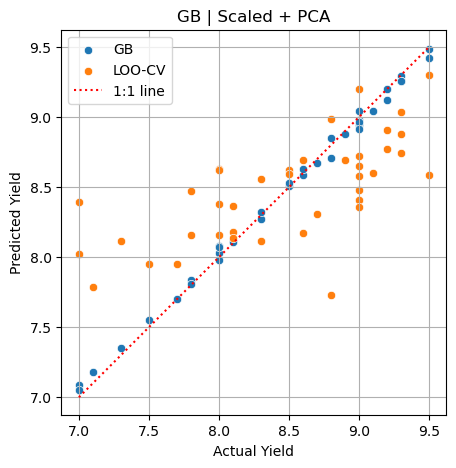


--- Hyperparameter Tuning for Random Forest ---
Best parameters for Random Forest: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 5}
Random Forest | Scaled + PCA LOOCV R2: 0.210
Random Forest | Scaled + PCA LOOCV MAE: 0.503
Random Forest | Scaled + PCA LOOCV RMAE: 5.9%
Random Forest | Scaled + PCA LOOCV RMSE: 0.619
Random Forest | Scaled + PCA LOOCV RRMSE: 7.3% 

Random Forest | Scaled + PCA R2: 0.800
Random Forest | Scaled + PCA MAE: 0.227
Random Forest | Scaled + PCA RMAE: 2.7%
Random Forest | Scaled + PCA RMSE: 0.311
Random Forest | Scaled + PCA RRMSE: 3.7%



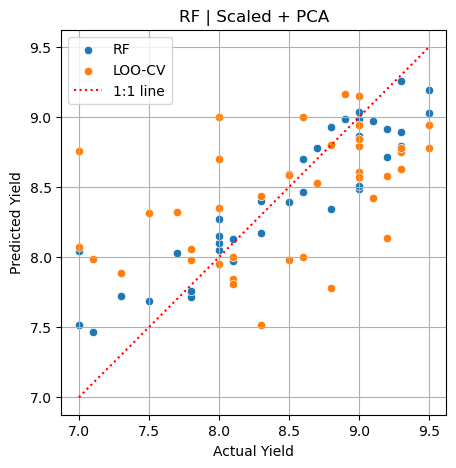


--- Hyperparameter Tuning for XGBoost ---
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 300}
XGBoost | Scaled + PCA LOOCV R2: 0.500
XGBoost | Scaled + PCA LOOCV MAE: 0.420
XGBoost | Scaled + PCA LOOCV RMAE: 5.0%
XGBoost | Scaled + PCA LOOCV RMSE: 0.493
XGBoost | Scaled + PCA LOOCV RRMSE: 5.8% 

XGBoost | Scaled + PCA R2: 1.000
XGBoost | Scaled + PCA MAE: 0.023
XGBoost | Scaled + PCA RMAE: 0.3%
XGBoost | Scaled + PCA RMSE: 0.028
XGBoost | Scaled + PCA RRMSE: 0.3%



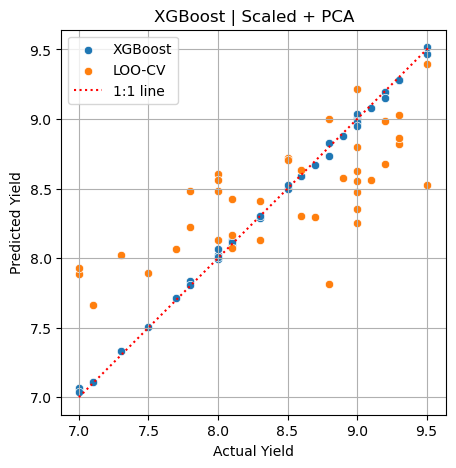


--- Hyperparameter Tuning for SVR ---
Best parameters for SVR: {'C': 0.5, 'epsilon': 0.01, 'gamma': 'scale', 'kernel': 'rbf'}
SVR | Scaled + PCA LOOCV R2: 0.230
SVR | Scaled + PCA LOOCV MAE: 0.474
SVR | Scaled + PCA LOOCV RMAE: 5.6%
SVR | Scaled + PCA LOOCV RMSE: 0.612
SVR | Scaled + PCA LOOCV RRMSE: 7.2% 

SVR | Scaled + PCA R2: 0.600
SVR | Scaled + PCA MAE: 0.281
SVR | Scaled + PCA RMAE: 3.3%
SVR | Scaled + PCA RMSE: 0.441
SVR | Scaled + PCA RRMSE: 5.2%



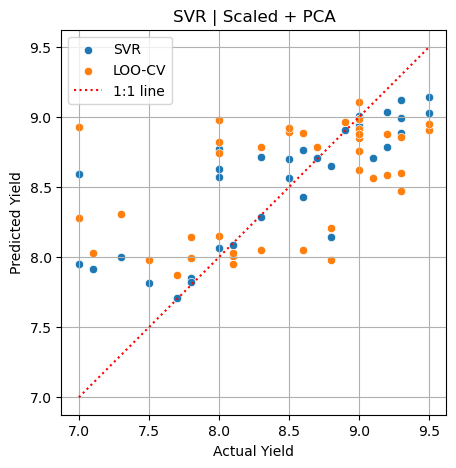


--- Hyperparameter Tuning for MLP ---
Best parameters for MLP: {'activation': 'logistic', 'alpha': 0.1, 'hidden_layer_sizes': (64, 64, 64), 'solver': 'adam'}
MLP | Scaled + PCA LOOCV R2: 0.250
MLP | Scaled + PCA LOOCV MAE: 0.491
MLP | Scaled + PCA LOOCV RMAE: 5.8%
MLP | Scaled + PCA LOOCV RMSE: 0.602
MLP | Scaled + PCA LOOCV RRMSE: 7.1% 

MLP | Scaled + PCA R2: 0.500
MLP | Scaled + PCA MAE: 0.415
MLP | Scaled + PCA RMAE: 4.9%
MLP | Scaled + PCA RMSE: 0.495
MLP | Scaled + PCA RRMSE: 5.8%



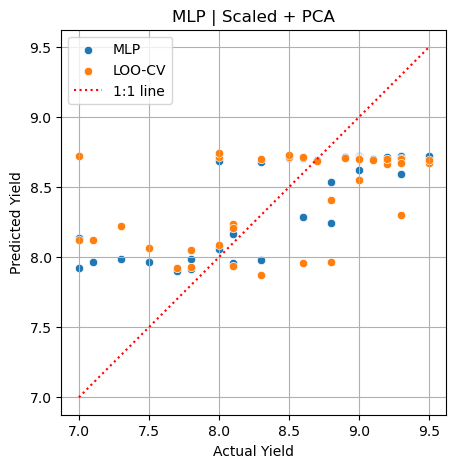

Voting Regressor | Scaled + PCA R2: 0.910
Voting Regressor | Scaled + PCA MAE: 0.146
Voting Regressor | Scaled + PCA RMAE: 1.7%
Voting Regressor | Scaled + PCA RMSE: 0.214
Voting Regressor | Scaled + PCA RRMSE: 2.5%



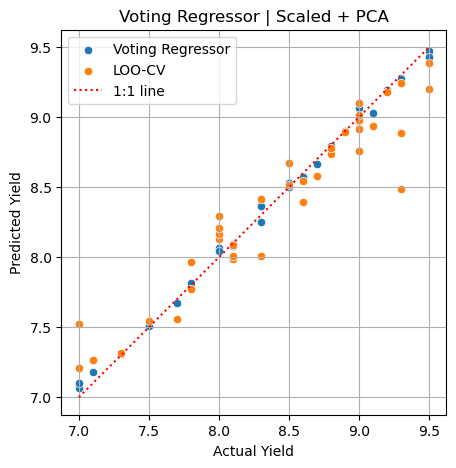


--- Model Performance Summary with LOO-CV ---


,R2,RRMSE (%),RMAE (%)
Ridge Regression,0.91,2.4,1.6
Voting Regressor,0.91,2.5,1.7
Lasso Regression,0.77,4.0,2.9
Linear Regression,0.69,4.6,2.3
XGBoost,0.50,5.8,5.0
Gradient Boosting,0.43,6.2,5.1
MLP,0.25,7.1,5.8
SVM,0.23,7.2,5.6
Random Forest,0.21,7.3,5.9
Decision Tree,0.22,7.3,5.5


In [331]:
DoModelTrainCV(X, X_scaled, y, doScale=True, doPCA=True, figSize=(5,5))